It is highly recommended to use a powerful **GPU**, you can use it for free uploading this notebook to [Google Colab](https://colab.research.google.com/notebooks/intro.ipynb).
<table align="center">
 <td align="center"><a target="_blank" href="https://colab.research.google.com/github/ezponda/intro_deep_learning_solutions/blob/main/class/CNN/Introduction_to_CNN.ipynb">
        <img src="https://i.ibb.co/2P3SLwK/colab.png"  style="padding-bottom:5px;" />Run in Google Colab</a></td>
  <td align="center"><a target="_blank" href="https://github.com/ezponda/intro_deep_learning_solutions/blob/main/class/CNN/Introduction_to_CNN.ipynb">
        <img src="https://i.ibb.co/xfJbPmL/github.png"  height="70px" style="padding-bottom:5px;"  />View Source on GitHub</a></td>
</table>

**0. 目标**
输入一张图片 → 输出它属于哪个类别（5 类：玫瑰/向日葵/…）。


**1. 准备数据**


读数据：从文件夹读取图片（按子文件夹名自动打标签）。


统一尺寸：把图缩放到同一大小（比如 96×96）。


打包批次：按批次（batch）喂给模型（如 32 或 64）。


加速autotune：cache()、shuffle()（只对训练集）、prefetch()。


可选增广augmentation：随机翻转/旋转/裁剪，提升泛化能力。


**2. 预处理**


归一化：Rescaling(1./255)，把像素从 0–255 变到 0–1，训练更稳。


**3. 建网络（典型骨架）**
[输入 (H,W,3)]
→ [卷积 Conv2D + ReLU]  学边缘/纹理等特征
→ [池化 MaxPooling]     降采样，保关键信息
→ [卷积 + 池化]×N        堆几次，学更复杂特征
→ [Flatten 或 GlobalAveragePooling] 变成向量
→ [Dense + ReLU]         做判别
→ [Dense + Softmax]      输出每个类别概率



padding='same' 常用：保持高宽不变，便于堆叠。


Flatten vs GlobalAveragePooling：后者更轻量稳健（不易过拟合）。


**4. 配置训练**


损失函数：


标签是整数 → sparse_categorical_crossentropy


标签是 one-hot → categorical_crossentropy




优化器：adam 常用好用。


指标：accuracy。

Loss function（也叫 objective function / cost function）

作用是什么？

用一个数字衡量当前模型的预测“有多差”。

训练时优化器（如 Adam、SGD）通过最小化损失函数来更新参数（用梯度下降）。

损失越小 → 模型越贴近真实标签。

为什么用损失而不是准确率？

准确率对“差一点”的预测不敏感、不可微分，不能直接做梯度下降。

损失函数通常是可导的，能提供方向和步幅（梯度）来学习。

常见类型与场景

回归：MSE（Mean Squared Error，均方误差）、MAE（Mean Absolute Error）。

二分类：Binary Cross-Entropy（二元交叉熵）。

多分类：Categorical Cross-Entropy（one-hot 标签），Sparse Categorical Cross-Entropy（整数标签）。

间隔学习：Hinge loss（如 SVM）。

排序/推荐/对比学习：Triplet loss、InfoNCE 等。

一句话：Loss function 是训练时的“指南针”，告诉模型往哪个方向、以多大力度改参数，直到预测更准。


**5. 开始训练**


model.fit(train_ds, validation_data=val_ds, epochs=10~30)


看训练/验证曲线：若验证准确率不上升或开始下降 → 可能过拟合。


**6. 评估与测试**


model.evaluate(test_ds) 查看最终准确率等指标。


model.predict(...) 做单张或批量预测，取 argmax 得类别。


**7. 常见调参小抄**


更深/更宽：增大 filters（如 32→64→128）、多堆几层卷积。


正则化 regularization：Dropout(0.3~0.5)、L2、用数据增广。


学习率：ReduceLROnPlateau 或 LearningRateScheduler。


早停：EarlyStopping 根据验证集自动停止。


迁移学习（高级招） transfer study：用 MobileNetV2/ResNet50 等预训练模型做特征，再接你的分类头，少数据也能有好效果。



一句话总结
把图片变成小批次 → 归一化 → “卷积+ReLU+池化”反复堆几次学特征 → 展平成向量或全局池化 → 全连接 + Softmax 输出概率 → 用合适的损失和优化器训练 → 评估与调参。

模版：

# ===== 0) 目标：输入图片 -> 输出5类概率 =====


import tensorflow as tf

from tensorflow import keras

from tensorflow.keras import layers

import pathlib

# ---- 超参 ----
DATA_DIR   = "/path/to/your/data"   # 目录结构: data/rose/*.jpg, data/sunflowers/*.jpg, ...

IMG_SIZE   = (96, 96)

BATCH_SIZE = 32

NUM_EPOCHS = 20

SEED       = 42

AUTOTUNE   = tf.data.AUTOTUNE

# ===== 1) 准备数据 =====
data_dir = pathlib.Path(DATA_DIR)

train_ds = tf.keras.utils.image_dataset_from_directory(

    data_dir,
    validation_split=0.2,   # 80% 训练, 20% 验证
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
)

val_ds = tf.keras.utils.image_dataset_from_directory(

    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
)

class_names = train_ds.class_names

num_classes = len(class_names)

print("Classes:", class_names)

# 加速：cache / shuffle(仅训练) / prefetch
train_ds = train_ds.cache().shuffle(1000, seed=SEED).prefetch(AUTOTUNE)

val_ds   = val_ds.cache().prefetch(AUTOTUNE)

# 可选：数据增广（训练时随机，验证/测试自动关闭）
data_augmentation = keras.Sequential([

    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.08),
    layers.RandomZoom(0.08),
], name="augmentation")

# ===== 2) 预处理 =====
# 归一化到[0,1]
rescale = layers.Rescaling(1./255, name="rescale")

# ===== 3) 建网络（典型骨架） =====
def build_cnn(input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3), num_classes= num_classes):

    inputs = keras.Input(shape=input_shape)

    x = data_augmentation(inputs)     # 如不想增广，可注释
    x = rescale(x)

    # Block 1
    x = layers.Conv2D(32, 3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)

    # Block 2
    x = layers.Conv2D(64, 3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)

    # Block 3（可按需要增减）
    x = layers.Conv2D(128, 3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)

    # Flatten vs GlobalAveragePooling（二选一，GAP更轻更稳）
    x = layers.GlobalAveragePooling2D()(x)
    # x = layers.Flatten()(x)

    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs, name="cnn_baseline")
    return model

model = build_cnn()

# ===== 4) 配置训练 =====
# 标签是整数 -> sparse_categorical_crossentropy；已用softmax -> 不要 from_logits=True
model.compile(

    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# ===== 5) 开始训练 =====
callbacks = [

    keras.callbacks.EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True),

    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)
]

history = model.fit(

    train_ds,
    validation_data=val_ds,
    epochs=NUM_EPOCHS,
    callbacks=callbacks,
    verbose=1
)

# ===== 6) 评估与测试 =====
eval_res = model.evaluate(val_ds, verbose=0)

print(f"Val Loss: {eval_res[0]:.4f} | Val Acc: {eval_res[1]:.4f}")

# 单张推理示例
import numpy as np

img_path = "/path/to/one/image.jpg"

img = tf.keras.utils.load_img(img_path, target_size=IMG_SIZE)

x   = tf.keras.utils.img_to_array(img)

x   = tf.expand_dims(x, 0)       # (1, H, W, 3)

x   = rescale(x)                 # 与训练一致

probs = model.predict(x)[0]      # (num_classes,)

pred  = int(np.argmax(probs))

print("Pred:", class_names[pred], "| Prob:", float(np.max(probs)))

# ===== 7) 常见调参位点（按需替换/开启） =====
# - 增大/减小 filters: 32→64→128
# - 增/减 卷积块数量（Block 3可删/可加Block 4）
# - 调整 Dropout(0.2~0.5) / 加 L2 正则：layers.Dense(..., kernel_regularizer=keras.regularizers.l2(1e-4))

# - 学习率策略见 ReduceLROnPlateau / 自定义 LearningRateScheduler

#可选）迁移学习模板：用 MobileNetV2 做特征，再接你的分类头

数据不多时常常更好用；注意其专属预处理为 mobilenet_v2.preprocess_input（[-1,1] 归一化）。

base = tf.keras.applications.MobileNetV2(

    input_shape=IMG_SIZE+(3,),
    include_top=False,
    weights='imagenet'
)
base.trainable = False  # 先冻结

inputs = keras.Input(shape=IMG_SIZE+(3,))

x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)  # 预处理到[-1,1]

x = base(x, training=False)

x = layers.GlobalAveragePooling2D()(x)

x = layers.Dropout(0.3)(x)

outputs = layers.Dense(num_classes, activation='softmax')(x)

tl_model = keras.Model(inputs, outputs, name="mobilenetv2_head")

tl_model.compile(optimizer='adam',
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])

tl_model.fit(train_ds, validation_data=val_ds, epochs=NUM_EPOCHS, callbacks=callbacks)

# 可选微调：解冻顶层少量层，小学习率
base.trainable = True

for layer in base.layers[:-20]:
    layer.trainable = False

tl_model.compile(optimizer=keras.optimizers.Adam(1e-5),
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
                 
tl_model.fit(train_ds, validation_data=val_ds, epochs=5, callbacks=callbacks)


<a id='Image Filtering'></a>
# Image Filtering

In [1]:
## if you have a GPU
GPU=True
#%tensorflow_version 2.x
import tensorflow as tf
if GPU:
    device_name = tf.test.gpu_device_name()
    if device_name != '/device:GPU:0':
        raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [2]:
import tensorflow as tf
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

Load the example image.

Load the example image.

You can download the image with an image url using [get_file](https://www.tensorflow.org/api_docs/python/tf/keras/utils/get_file)
```python
tf.keras.utils.get_file(
    fname, origin, untar=False, md5_hash=None, file_hash=None,
    cache_subdir='datasets', hash_algorithm='auto',
    extract=False, archive_format='auto', cache_dir=None
)
```

In [4]:
img_folder= '../../images'
#url = "https://github.com/ezponda/intro_deep_learning/blob/main/images/taj-mahal.png"
url = 'https://i.ibb.co/vd1SqSM/The-grandeur-of-the-Taj-Mahal-and-its-intricate-stone-inlays-immediately-greets-the-visitor-upon-ent.jpg'
image_path = tf.keras.utils.get_file("taj-mahal-2.jpg", url)
#pic = 'taj-mahal.jpg'
#image_path = os.path.join(img_folder, pic)

138206/138206 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [5]:
def read_image(image_path, target_size=None):
    image = tf.keras.preprocessing.image.load_img(image_path,
                target_size=target_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = image.astype(np.uint8)
    return image

image = read_image(image_path)

We can see that the dimensions of the image are (468, 468, 3).

That is, the image has a resolution of **468x468 pixels**, with **3 color channels (Red, Green and Blue)**.

In [6]:
image.shape

(468, 468, 3)

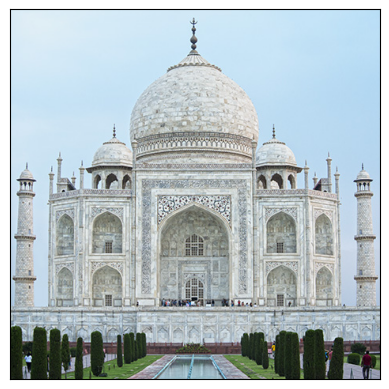

In [7]:
plt.imshow(image)
plt.xticks([])
plt.yticks([])
plt.show()

### Convolution examples

The following kernel performs the identity operation. The result of the convolution returns the original image.

卷积时，这个 3×3 小方块会像“滑窗”一样在图像上逐像素移动。

每次把窗口覆盖到的 9 个像素与核中对应的 9 个权重做加权求和，结果作为中心像素的新值。

这个核的中心是 1，其余都是 0 → 也就是只保留中心像素本来的值，邻居像素对结果完全没贡献。

filter2D 会把 kernel 应用到每个通道（RGB 各自做一遍）。

第二个参数 -1 表示输出图像的深度与输入相同。

由于 kernel 只让中心像素通过，输出看起来与输入没有变化。

对比理解（若改动权重会得到不同效果）：

全 1 后再除以 9 → 均值模糊（平滑）

中心为正、周围为负的核 → 边缘检测/锐化

高斯形状的核 → 高斯模糊

所以，这个 array 就是一个“啥也不干”的基准核，用来演示卷积机制：只有中心像素被保留，结果等于原图。

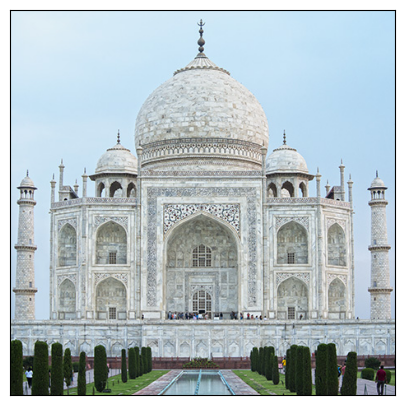

In [8]:
identity_kernel = np.array([
    [0, 0, 0],
    [0, 1, 0],
    [0, 0, 0]
])

img = cv2.filter2D(image, -1, identity_kernel)

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(img);

The following filter applies the [Box Blur] (https://en.wikipedia.org/wiki/Box_blur), where each pixel of the resulting image has a value equal to the mean of its pixel values neighbors.

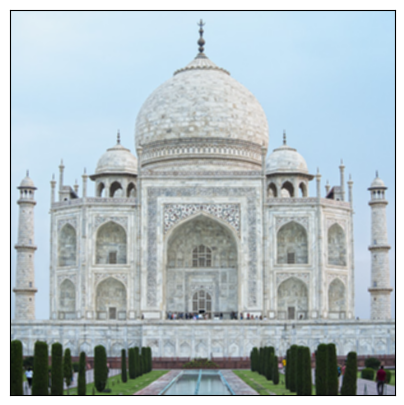

In [9]:
box_blur_filter = (1/9) * np.array([
    [1, 1, 1],
    [1, 1, 1],
    [1, 1, 1]
])

img = cv2.filter2D(image, -1, box_blur_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(img);

The following example shows a filter widely used in digital image processing: the [Gaussian filtering] (https://en.wikipedia.org/wiki/Gaussian_blur).

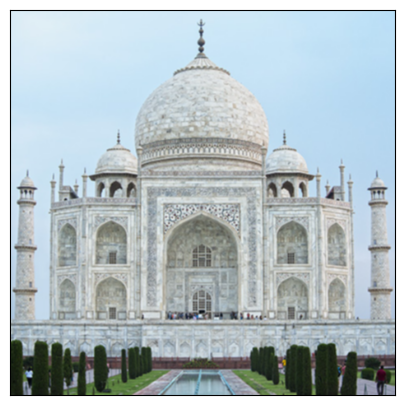

In [10]:
gaussian_blur_filter = (1/16) * np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
])

img = cv2.filter2D(image, -1, gaussian_blur_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])

plt.imshow(img);

We can gaussian noise to the image and see the effects

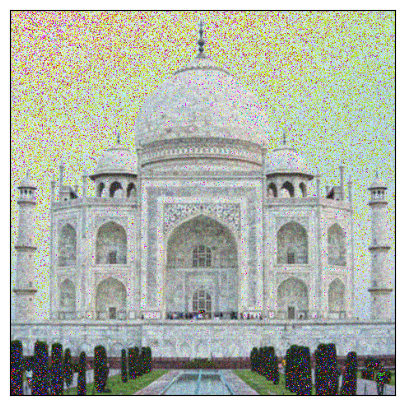

In [11]:
sigma = 20
n, m, k = image.shape
img_noise = img + sigma*np.random.randn(n, m, k)
fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])

plt.imshow(img_noise.astype(np.uint8));

np.random.randn(n,m,k) 生成均值 0、方差 1 的高斯噪声，每个像素每个通道都独立采样。

乘上 sigma=20 就把标准差放大为 20（像素强度单位）。

与原图 img 相加就是加性高斯噪声（AWGN）。你看到的彩色小点就是各通道分别被扰动后的结果。

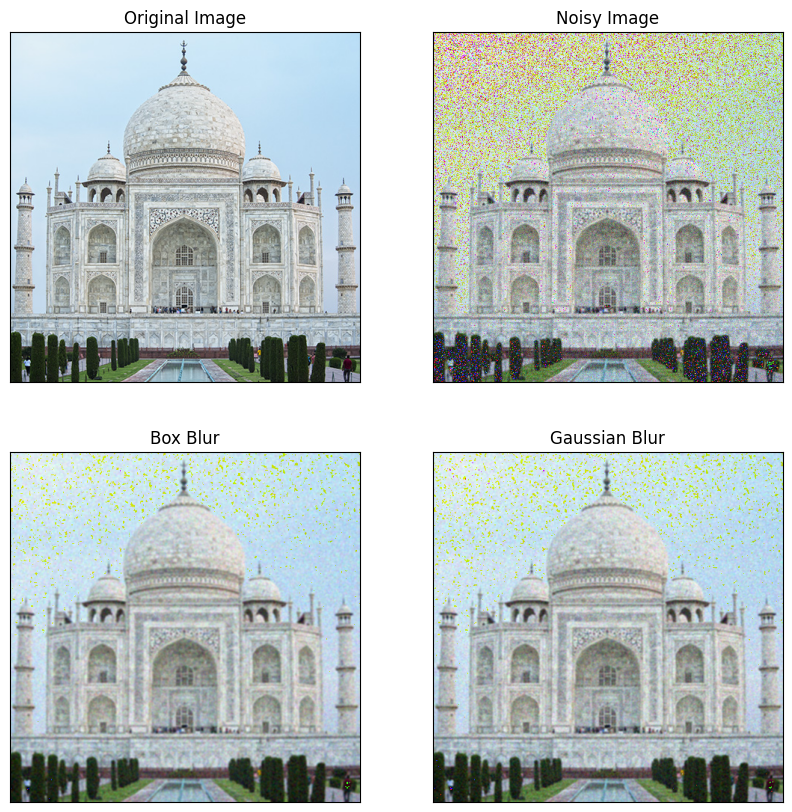

In [12]:
img1 = cv2.filter2D(img_noise, -1, gaussian_blur_filter)

fig, ax = plt.subplots(2, 2, figsize=(10, 10))

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])

ax[0, 0].set_title('Original Image')
ax[0, 0].imshow(image.astype(np.uint8));

ax[0, 1].set_title('Noisy Image')
ax[0, 1].imshow(img_noise.astype(np.uint8));

ax[1, 0].set_title('Box Blur')
ax[1, 0].imshow(cv2.filter2D(img_noise, -1, box_blur_filter).astype(np.uint8));

ax[1, 1].set_title('Gaussian Blur')
ax[1, 1].imshow(cv2.filter2D(img_noise, -1, gaussian_blur_filter).astype(np.uint8));

The following filter is used for edge detection in images.

怎么理解它在做什么：

核在水平方向是反对称：左边为 +1，右边为 −1，中间 0。

卷积时，它近似计算了横向梯度 Gx：

左侧像素亮、右侧暗 ⇒ (+1)*左 − (1)*右 为正 ⇒ 显示亮边（左亮右暗的垂直边）。

左暗右亮 ⇒ 值为负 ⇒ 若不取绝对值会被裁成黑色。

所以它主要检测垂直边缘（类似 Prewitt/Sobel 的 x 方向，只是没做平滑）。

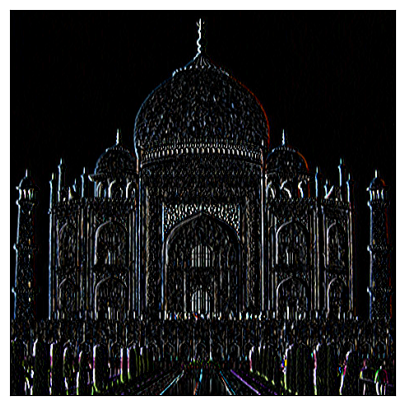

In [13]:
edge_detection_filter = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
])

img = cv2.filter2D(image, -1, edge_detection_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])

plt.imshow(img);

权重之和为 0（高通）：中心像素乘 −4，四个上下左右像素各 +1 → 中心与四邻域的差被放大。

图像在强度变化快（曲率大）的地方输出大幅度正/负值，所以各方向的边缘都会被突出（与 Sobel/Prewitt 这种“一阶导、定向”不同，Laplacian 是二阶导、无方向）。

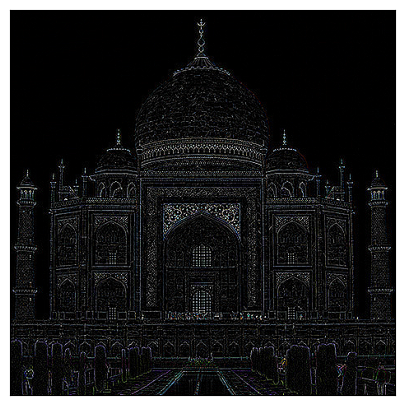

In [14]:
edge_detection_filter = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]
])

img = cv2.filter2D(image, -1, edge_detection_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])

plt.imshow(img);

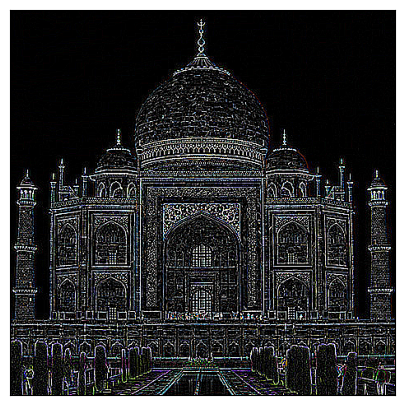

In [15]:
edge_detection_filter = np.array([
    [1, 1, 1],
    [1, -8, 1],
    [1, 1, 1]
])

img = cv2.filter2D(image, -1, edge_detection_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])

plt.imshow(img);

The following filter allows you to highlight the edges of the image by increasing its contrast. The filter is the result of subtracting the matrix of an edge detection filter from the matrix of an identity filter:

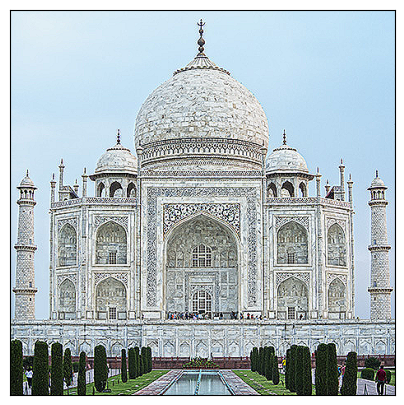

In [16]:
sharpen_flter = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

img = cv2.filter2D(image, -1, sharpen_flter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])
plt.imshow(img);

OpenCV provides a multitude of techniques for digital image processing. Other examples of filters that we can apply to images are, for example, those that allow us to perform [morphological transformations] (https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_morphological_ops/py_morphological_ops.html).

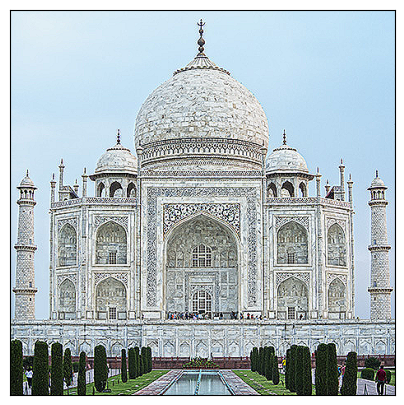

In [17]:
kernel = np.ones((1, 1), np.uint8)
dilation = cv2.dilate(img, kernel, iterations=1)


fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])
plt.imshow(dilation)

<a id='image_classification_cnn'></a>
# Image Classification CNN

In this section we will study the problem of classifying images with convolutional neural networks (CNN). To do this, we will rely on the [TensorFlow tutorial](https://www.tensorflow.org/tutorials/images/classification).

We will start with the download of the dataset. We will work with a set of **~ 3700 photographs** of flowers from **5 different classes**.

In [18]:
import pathlib
import tensorflow as tf
dataset_url = 'https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz'
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, extract=True)
data_dir = pathlib.Path(data_dir)

228813984/228813984 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


We check that we have all the photographs.

In [29]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

0


In [19]:
import pathlib, tensorflow as tf

dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
root = tf.keras.utils.get_file(origin=dataset_url, extract=True, archive_format="tar")
root = pathlib.Path(root)

# 如果 get_file 返回的是文件路径，就取其父目录；否则它本身就是目录
base = root.parent if root.is_file() else root

# 进入真正的数据目录
data_dir = base / "flower_photos"

# 递归统计（最稳妥）
image_count = sum(1 for _ in data_dir.rglob("*.jpg"))
print(data_dir, image_count)   # 约 3670


228813984/228813984 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
/root/.keras/datasets/flower_photos.tgz/flower_photos 3670


In [20]:
os.listdir(data_dir)

['daisy', 'LICENSE.txt', 'sunflowers', 'dandelion', 'roses', 'tulips']

Visualize some of them

In [21]:
roses = list(data_dir.glob('roses/*'))
sunflowers = list(data_dir.glob('sunflowers/*'))

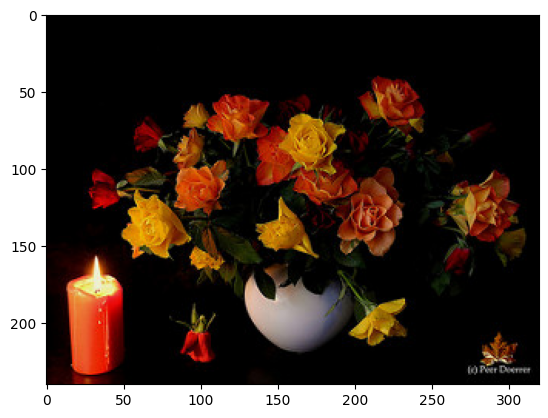

In [22]:
im = read_image(str(roses[np.random.randint(0, len(roses))]))
plt.imshow(im);

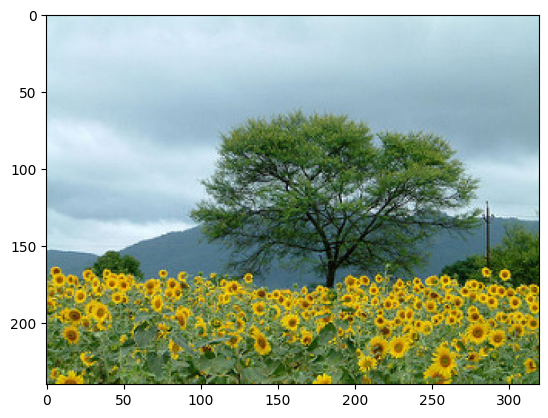

In [23]:
im = read_image(str(sunflowers[np.random.randint(0, len(sunflowers))]))
plt.imshow(im);

We create a TensorFlow dataset with the data that we have previously loaded to disk with the [`image_dataset_from_directory ()`](https://keras.io/api/preprocessing/image/#image_dataset_from_directory-function)
method.

The `colos_mode` parameter (by default 'rgb') allows you to choose the color scale to use. To automatically load and convert the images to grayscale it must be set as `color_mode = grayscale`.

In [24]:
image_size = (96,96)
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,  # 80%  train, 20% validation
  subset='training',  # 'training' o 'validation', only  with 'validation_split'
  seed=1,
  image_size=image_size,  # Dimension (img_height, img_width) for rescaling
  batch_size=64
)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [25]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset='validation',
  seed=1,
  image_size=image_size,
  batch_size=64)


Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [26]:
class_names_list = train_ds.class_names
class_names_list

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

### Configure the dataset for performance

Let's make sure to use buffered prefetching so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data.

`Dataset.cache()` keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.

`Dataset.prefetch()` overlaps data preprocessing and model execution while training.

Interested readers can learn more about both methods, as well as how to cache data to disk in the [data performance guide](https://www.tensorflow.org/guide/data_performance#prefetching).

这段是把 tf.data.Dataset 做加速优化与可视化

cache()

第一次把样本从磁盘读进来后缓存起来（默认在内存）。下个 epoch 训练就不用再读磁盘了。

数据集太大放不下内存时，可用 cache("path/to/cache") 把缓存落盘。

shuffle(1000)

维持一个大小为 1000 的随机缓冲区，每取一个样本就从缓冲区随机取并补进新的。数值越大→随机性越好、占内存也越多。只对 train 用，val/test 不要 shuffle。

prefetch(AUTOTUNE)

生产与训练并行：在 GPU/模型训练当前批次时，CPU 异步地准备下一个批次，减少空转时间。AUTOTUNE 让 TF 自己估最佳预取大小。

顺序：一般推荐 dataset = dataset.cache().shuffle(...).batch(...).prefetch(AUTOTUNE)；若你前面还有 map() 做解析/增广，则常写成 map(...)→cache→shuffle→batch→prefetch。

In [27]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

Visualizing some training samples.

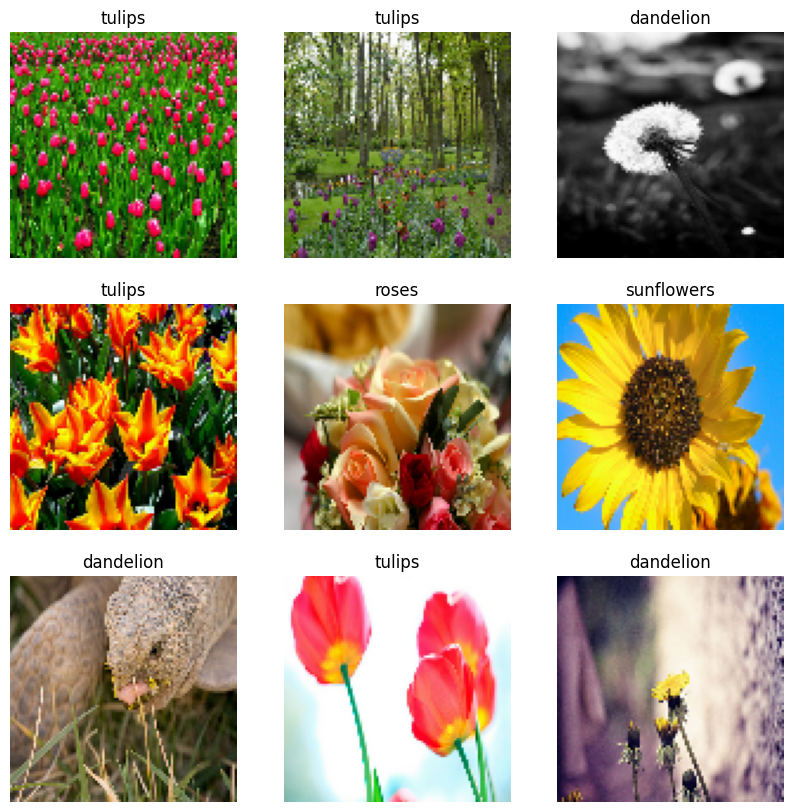

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names_list[labels[i]])
        plt.axis("off")

这 9 张图代表什么

来源：for images, labels in train_ds.take(1) 从训练集里拿 1 个 batch。

images：形状一般是 (batch_size, img_h, img_w, 3) 的张量（RGB）。
你用 images[i].numpy().astype("uint8") 转成可显示的图片。

labels：同批次里每张图的类别索引（整数，如 0~4）。

标题：class_names_list[labels[i]] 把整数标签映射成人类可读类别名（如 roses, sunflowers, tulips）。

重复类：同一批次里出现多张同类图是正常的，因为随机抽样 + shuffle。

上下游逻辑（数据是怎样一步步来到这里的）

从目录读图（多半用 tf.keras.utils.image_dataset_from_directory）：自动按子文件夹名生成类别标签。

resize / rescale / augment（可选）：

若你在创建数据集时设置了 image_size=(h,w)，图片会被统一尺寸。

若做了归一化（比如除以 255），显示前需要转回 uint8 才不灰。

batch：把样本打包成小批量（例如 32 张一包）。

cache → shuffle(1000) → prefetch(AUTOTUNE)：加速训练、打乱顺序、异步准备下一个批次。

take(1)：只拿一个批次来可视化。

imshow：把该批次中的前 9 张画出来，并用 labels 映射的类名作为标题。

这 9 张图是训练数据管线输出的一个小批次的“抽样预览”：images[i] 是该批次里的第 i 张图片，labels[i] 是它的类别索引，标题是把索引映射成的类别名。目的只是确认加载/标注/尺寸/预处理都正确，再开始训练。

We build the model. The **input will have a dimension of (n, n, 3)**, corresponding to (image height, image width, number of color channels).

At the input of the network we include a preprocessing that will allow the images to be rescaled by normalizing the pixel values to a range between 0 and 1.

In [29]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(64, 96, 96, 3)
(64,)


64：本次迭代取到的 batch size（一批有 64 张图）。

96, 96：每张图被 resize 到 96×96 像素。

3：RGB 三个通道。

labels_batch 的 (64,) 说明每张图对应一个整数类别索引（稀疏标签），而不是 one-hot 向量。

In [30]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

## CNN model in Keras



<img src="https://i.ibb.co/D8CmT6K/cnn.jpg" alt="cnn" border="0">



A Convolutional Neural Network (CNN) architecture has four main parts:

- A **convolutional layer** that extracts features from a source image.

- A **pooling layer** that reduces the image dimensionality without losing important features or patterns.

- A **flattening layer** that transforms a n-dimensional tensor into a vector that can be fed into a fully connected neural network.

- A **fully connected layer** also known as the dense layer.

### Rescaling

For converting the images to   \[0,1\] range.
```python
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)
next_layer = normalization_layer(prev_layer)
```
or simply
```python
reescaling = layers.experimental.preprocessing.Rescaling(1. / 255)(inputs)
```

### Convolutional layer

In the convolutional layers (`Conv2D`) we will configure the following parameters:

- **filters**: number of feature maps.
- **kernel_size**: can be either an integer or a tuple of two integers. Specifies the height and width of the kernel.
- **padding**: allows you to include padding in the input data. With 'valid' it is not applied, with 'same' it is configured so that the dimension at the output of the convolution is the same as at the input.
- **activation**: activation function implemented. Recommended ReLU.

[Link to documentation](https://keras.io/api/layers/convolution_layers/convolution2d/)

```python
tf.keras.layers.Conv2D(
    filters, kernel_size, strides=(1, 1), padding='valid',
    activation=None, kernel_regularizer=None)

```

With Functional API:
```python
next_layer = layers.Conv2D(filters=8, kernel_size=3, activation='relu', name='conv_1')(prev_layer)
```

With Sequential:
```python
model.add(layers.Conv2D(filters=8,kernel_size=3, activation='relu', name='conv_1'))
```

### Pooling layer

A pooling layer is a new layer added after the convolutional layer. Specifically, after a nonlinearity ( ReLU) you can choose between [average pooling](https://www.tensorflow.org/api_docs/python/tf/keras/layers/AveragePooling2D) or [max pooling](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D). Usually max pooling is the best choice.


With Functional API:
```python
conv_1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', name='conv_1')(prev_layer)

pool_1 = layers.MaxPool2D(pool_size=(2, 2), name='pool_1')(conv_1)
```

With Sequential:
```python
model.add(layers.AveragePooling2D(pool_size=(2, 2), name='pool_1'))
```

### Flattening

Prepares a vector for the fully connected layers.

With Functional API:

```python
next_layer = layers.Flatten(name='flatten')(prev_layer)
```

With Sequential:
```python
model.add(layers.Flatten(name='flatten'))
```

There is another alternative for flattening that is a type of pooling that is called global pooling. Global pooling down-samples the entire feature map to a single value.

You can also choose between [GlobalAveragePooling2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/GlobalAveragePooling2D) and [GlobalMaxPooling2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/GlobalMaxPool2D).

```python
model.add(layers.GlobalMaxPool2D(name='GlobalMaxPooling2D'))
```

### Fully-connected layer

Dense layer like a simple neural network

1) 整体结构（图里那条管线）

输入 → [卷积+ReLU] → 池化 → [卷积+ReLU] → 池化 → 展平/全局池化 → 全连接 → Softmax（输出类别概率）

卷积层 (Conv2D)：用很多“小滤波器/卷积核”在图像上滑动，学到边缘、纹理、形状等特征。

激活 ReLU：把负数截断为 0，增加非线性，让网络能学复杂模式。

池化层 (Pooling)：缩小特征图的高宽，保关键信息，降计算量、防过拟合。

Flatten / Global Pooling：把 2D 特征转换成向量（或直接降到每个通道 1 个数）。

全连接 (Dense)：像普通神经网络一样做最后的判别。

Softmax：把输出变成每个类的概率（所有类加起来=1）。



2) 预处理：Rescaling（像素缩放到 0~1）

layers.Rescaling(1./255)
把原始 0–255 的像素除以 255，数值更小更稳定，训练更容易收敛。



3) 卷积层 (Conv2D) 参数怎么理解
layers.Conv2D(
  filters=8,          # 这一层学“8种特征图”
  kernel_size=3,      # 卷积核大小 3x3（常用）
  strides=(1,1),      # 步长，默认 1
  padding='valid',    # 'valid' 不补边 → 尺寸变小；'same' 补零 → 尺寸不变（便于堆叠）
  activation='relu'   # 常用 ReLU
)


filters 越多，能学的特征越丰富，但参数和计算也更多。

kernel_size=3 是默认首选；想看到更大范围可以用 5，但通常堆叠多个 3×3 更常见。

padding='same' 在深层网络里很常用，因为高宽不变，结构更规整。

在 CNN 里，padding（填充）就是在输入特征图的四周补上一圈（或多圈）像素，常用是补 0。目的：

控制输出尺寸

不填充会越卷越小。

通过填充可以让输出与输入同尺寸，便于堆叠更多层。

利用边界信息

没有填充时，边缘像素被“用得更少”；填充能让卷积在边缘也完整滑动。

两个最常用选项（Keras / TensorFlow）

padding='valid'：不填充（“原汁原味”）。输出会变小。

padding='same'：按需要自动填充，使输出的高宽与输入相同（当 stride=1 时）。

4) 池化层 (Pooling)

MaxPooling2D(pool_size=2,2)：每个 2×2 小块里取最大值 → 保边缘/纹理更好（默认首选）。

AveragePooling2D：取均值，更平滑。

作用：降采样（高宽减半），参数量不变，计算更省、过拟合更少。

5) 展平 vs 全局池化

两种把“2D特征图 → 向量”的方式：

Flatten()：把 H×W×C 直接铺平成一个长向量，接 Dense。参数多、表达力强，但容易过拟合。

GlobalAveragePooling2D() / GlobalMaxPooling2D()：对每个通道做全局汇聚（平均/最大），输出长度=C 的向量，参数更少、更稳，现在很常用，尤其配合深层卷积。

简单记忆：想轻量稳健选 GlobalAveragePooling2D；想更强表达且数据多可选 Flatten。

6) 全连接 + Softmax（分类头）
layers.Dense(128, activation='relu'),   # 可加 Dropout(0.5) 防过拟合
layers.Dense(num_classes, activation='softmax')


最后一层神经元个数 = 类别数。

多分类常用 loss='sparse_categorical_crossentropy'（标签是整数）或 categorical_crossentropy（one-hot 标签）。

In [43]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.experimental.preprocessing.Rescaling(1. / 255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(4, 3, padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(4, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)


# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

AttributeError: module 'keras._tf_keras.keras.layers' has no attribute 'experimental'

In [31]:
from tensorflow import keras
from tensorflow.keras import layers

image_size = (96, 96)   # 你的输入尺寸
num_classes = 5

inputs = keras.Input(shape=image_size + (3,), name='input')

# ✅ 正确的 Rescaling
x = layers.Rescaling(1./255, name='rescale')(inputs)

# Conv 1 + Pool
x = layers.Conv2D(4, 3, padding='valid', activation='relu', name='conv_1')(x)
x = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(x)

# Conv 2 + Pool
x = layers.Conv2D(4, 3, padding='valid', activation='relu', name='conv_2')(x)
x = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(x)

# Flatten + Dense + Softmax
x = layers.Flatten(name='flatten')(x)
x = layers.Dense(64, activation='relu', name='dense')(x)
outputs = layers.Dense(num_classes, activation='softmax', name='output')(x)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.summary()


Model: "cnn_example"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescale (Rescaling)             │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 94, 94, 4)      │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1 (MaxPooling2D)           │ (None, 47, 47, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 45, 45, 4)      │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2 (MaxPooling2D)           │ (None, 22, 22, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1936)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       123,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,553 (486.54 KB)

 Trainable params: 124,553 (486.54 KB)

 Non-trainable params: 0 (0.00 B)

Conv2D（二维卷积层）：在高×宽的平面上，用很多卷积核（小滤波器）滑动做加权求和，输出新的特征图（feature maps）。它的作用是提取局部特征（边缘、纹理、形状），并把通道数从 C_in 变成你设定的 filters 个 C_out。

典型形状变化：(B, H, W, C_in) → (B, H', W', C_out)（H'/W' 由 padding/stride 决定）

关键参数：filters、kernel_size、stride、padding、activation

Flatten（展平层）：把整张特征图按元素拉直成一根向量，不做卷积、不提特征。

形状变化：(B, H, W, C) → (B, H*W*C)

GlobalAveragePooling2D（常被拿来和 Flatten 对比）：对每个通道做全局平均，得到更短的向量，更不容易过拟合。

形状变化：(B, H, W, C) → (B, C)

Pooling（池化）的作用一句话：
把特征图“压缩”一下，只保留最重要的信息，降尺寸、降计算、降过拟合，并让模型对小的平移/形变更稳健（不那么敏感）。
具体做了啥


在特征图上以小窗口滑动（常见 2×2、步长 2），把窗口里的像素汇聚成一个值：


MaxPooling：取最大值（最常用，能保边缘/纹理的强响应）。


AveragePooling：取平均值（更平滑）。


GlobalAverage/MaxPooling：对整张特征图做汇聚 → 每个通道变成1 个数（常用来替代 Flatten，参数更少、不过拟合）。




为什么有用


降维/降计算：例如 H×W 经过 2×2, stride=2 变成 H/2 × W/2，后续卷积和全连接更省算力。


提高鲁棒性：小范围的位移、噪声变化后，最大值/均值变化不大，特征更稳定（一定程度的“平移不变性”）。


防过拟合：减少后续层的参数量（尤其替换 Flatten 时效果明显）。


快速尺寸例子


输入 32×32×64 → MaxPool(2×2, stride=2) → 输出 16×16×64（通道数不变，高宽减半）。


何时用


通常每 1–2 个卷积层后接一次池化。


想做轻量分类头时：GlobalAveragePooling2D 接 Dense（比 Flatten 更稳）。


小提醒


过多池化会丢细节；若要保持分辨率，可改用 stride=1 的卷积或少用池化。



In [ ]:
model.summary()

Model: "cnn_example"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           [(None, 96, 96, 3)]       0         
_________________________________________________________________
rescaling (Rescaling)        (None, 96, 96, 3)         0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 94, 94, 4)         112       
_________________________________________________________________
pool_1 (MaxPooling2D)        (None, 47, 47, 4)         0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 45, 45, 4)         148       
_________________________________________________________________
pool_2 (MaxPooling2D)        (None, 22, 22, 4)         0         
_________________________________________________________________
flatten (Flatten)            (None, 1936)              

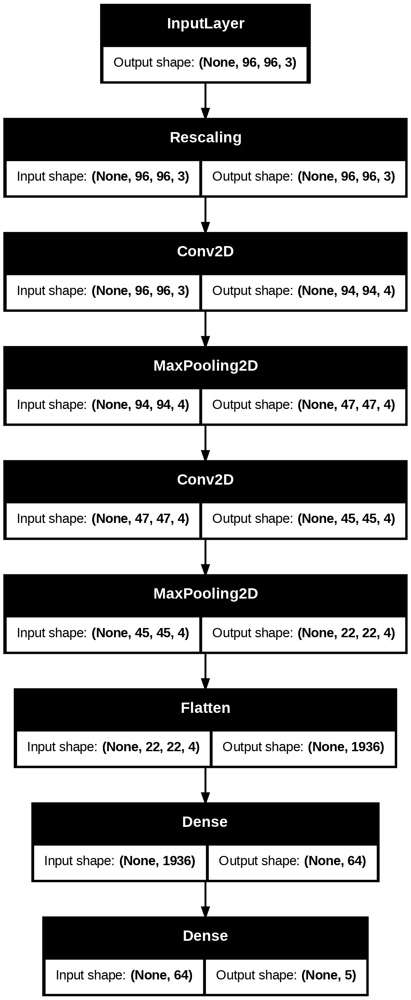

In [32]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True)

Compile the model

In [33]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

Training the model

In [34]:
epochs = 8
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)

Epoch 1/8


/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/nn.py:717: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


46/46 ━━━━━━━━━━━━━━━━━━━━ 15s 287ms/step - accuracy: 0.2824 - loss: 1.5842 - val_accuracy: 0.3896 - val_loss: 1.4163
Epoch 2/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 19s 262ms/step - accuracy: 0.4466 - loss: 1.3259 - val_accuracy: 0.4537 - val_loss: 1.2510
Epoch 3/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - accuracy: 0.5033 - loss: 1.1946 - val_accuracy: 0.5232 - val_loss: 1.1584
Epoch 4/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 262ms/step - accuracy: 0.5697 - loss: 1.0651 - val_accuracy: 0.5450 - val_loss: 1.1473
Epoch 5/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 256ms/step - accuracy: 0.6042 - loss: 0.9850 - val_accuracy: 0.5804 - val_loss: 1.0629
Epoch 6/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - accuracy: 0.6467 - loss: 0.9311 - val_accuracy: 0.5722 - val_loss: 1.0530
Epoch 7/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - accuracy: 0.6591 - loss: 0.8773 - val_accuracy: 0.5872 - val_loss: 1.0411
Epoch 8/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 21s 263ms/step - accuracy: 0.7051 - loss: 0.7990 - val_accuracy: 0.5967 - val

Visualize the results

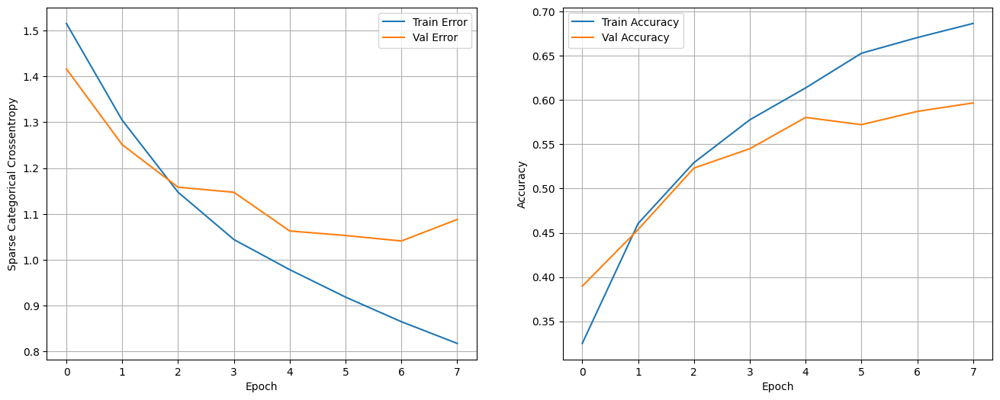

In [35]:
import pandas as pd
def show_loss_accuracy_evolution(history):

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Sparse Categorical Crossentropy')
    ax1.plot(hist['epoch'], hist['loss'], label='Train Error')
    ax1.plot(hist['epoch'], hist['val_loss'], label = 'Val Error')
    ax1.grid()
    ax1.legend()

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.plot(hist['epoch'], hist['accuracy'], label='Train Accuracy')
    ax2.plot(hist['epoch'], hist['val_accuracy'], label = 'Val Accuracy')
    ax2.grid()
    ax2.legend()

    plt.show()

show_loss_accuracy_evolution(history)

Plot bad predictions

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


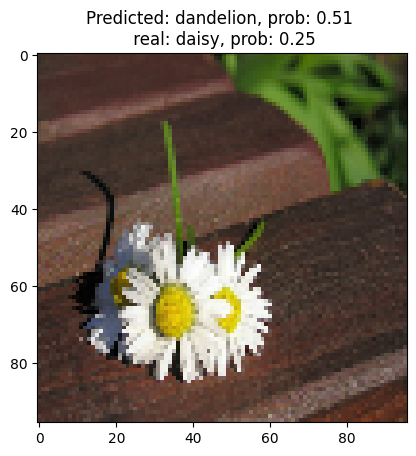

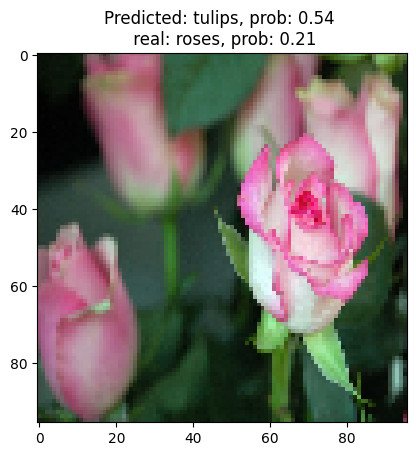

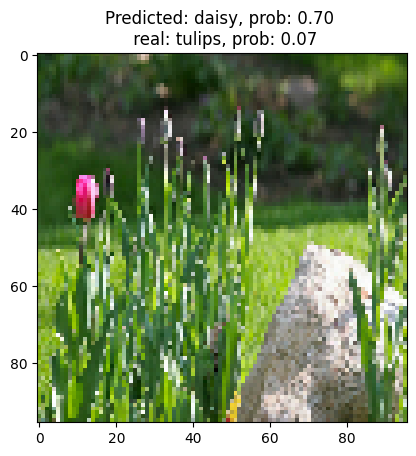

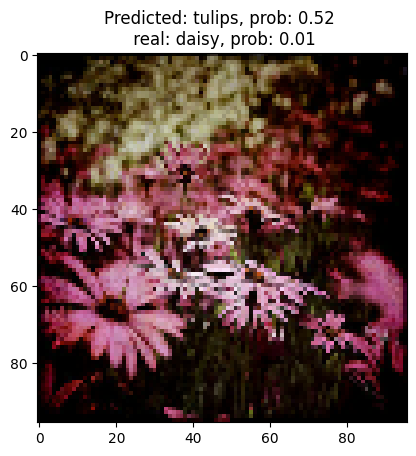

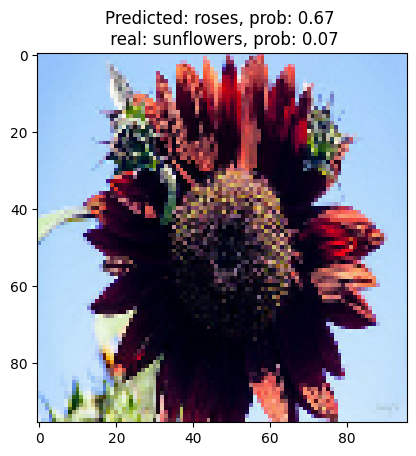

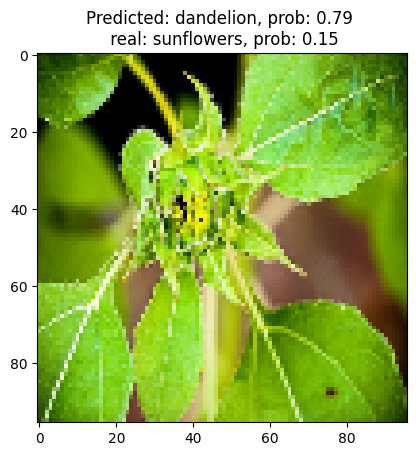

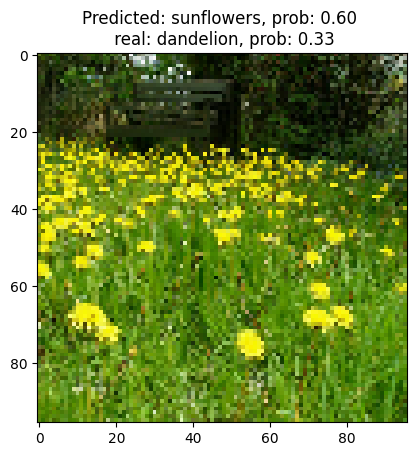

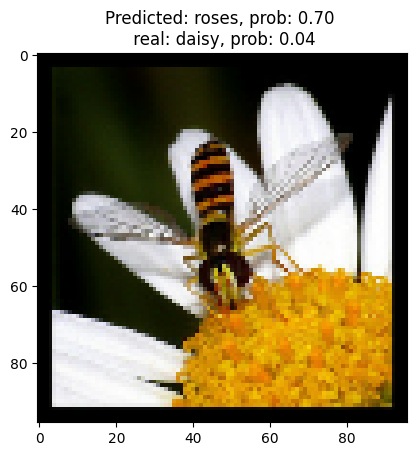

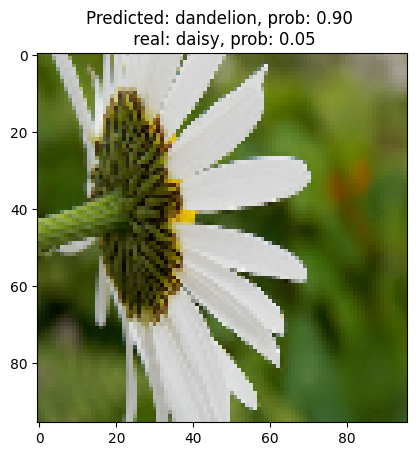

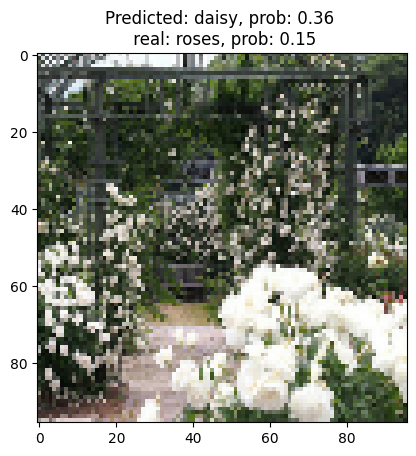

In [36]:
def show_errors(val_ds, model, class_names_list, n_images=10):
    n_plots = 0
    for images, labels in val_ds:
        pred_probs = model.predict(images)
        preds = pred_probs.argmax(axis=-1)
        bad_pred_inds = np.where(preds != labels)[0]
        for ind in list(bad_pred_inds):
            n_plots += 1
            real_class = class_names_list[labels[ind].numpy()]
            pred_class = class_names_list[preds[ind]]
            prob = pred_probs[ind].max()
            prob_real = pred_probs[ind][[
                i for i, c in enumerate(class_names_list) if c == real_class
            ][0]]
            plt.imshow(images[ind].numpy().astype("uint8"))
            plt.title(
                'Predicted: {0}, prob: {1:.2f} \n real: {2}, prob: {3:.2f}'
                .format(pred_class, prob, real_class, prob_real))
            plt.show()

            if n_plots == n_images:
                return
    return


show_errors(val_ds, model, class_names_list, n_images=10)

#### Question 1: What happen with the validation loss and with the number of parameters if you increment the number of filters and the kernel_size ?

Model: "cnn_example"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           [(None, 96, 96, 3)]       0         
_________________________________________________________________
rescaling_1 (Rescaling)      (None, 96, 96, 3)         0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 94, 94, 32)        896       
_________________________________________________________________
pool_1 (MaxPooling2D)        (None, 47, 47, 32)        0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 45, 45, 16)        4624      
_________________________________________________________________
pool_2 (MaxPooling2D)        (None, 22, 22, 16)        0         
_________________________________________________________________
flatten (Flatten)            (None, 7744)              

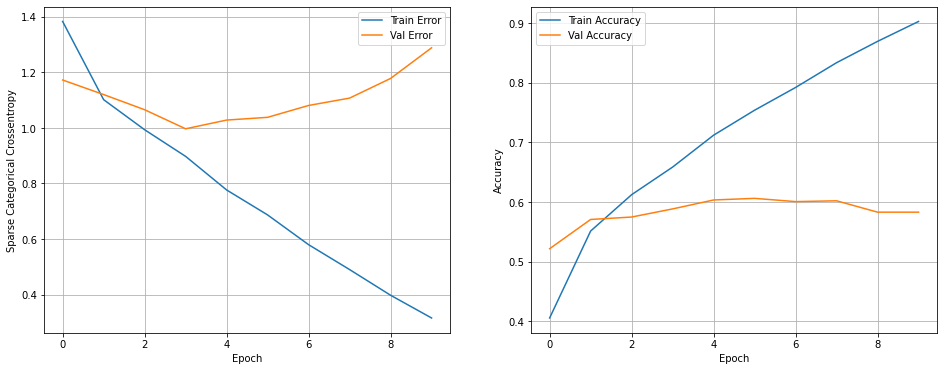

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.experimental.preprocessing.Rescaling(1. / 255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=32, kernel_size=3, padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(16, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)


# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

print(model.summary())

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)
show_loss_accuracy_evolution(history)

#### Question 2: What happen with the validation loss and with the number of parameters if you vary  the `pool_size` and the padding of the filters to `same` ?

Model: "cnn_example"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           [(None, 96, 96, 3)]       0         
_________________________________________________________________
rescaling_2 (Rescaling)      (None, 96, 96, 3)         0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 94, 94, 32)        896       
_________________________________________________________________
pool_1 (MaxPooling2D)        (None, 31, 31, 32)        0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 29, 29, 16)        4624      
_________________________________________________________________
pool_2 (MaxPooling2D)        (None, 9, 9, 16)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1296)              

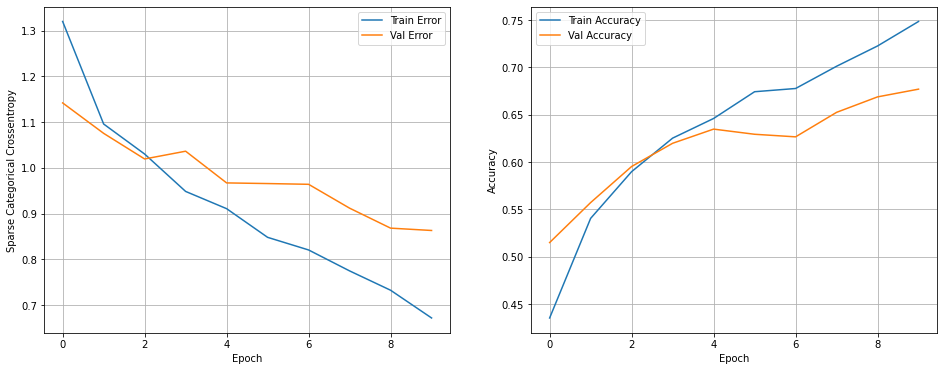

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.experimental.preprocessing.Rescaling(1. / 255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=32, kernel_size=(3,3), padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(3, 3), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(16, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(3, 3), name='pool_2')(conv_2)

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

print(model.summary())

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)
show_loss_accuracy_evolution(history)

#### Question 3: Create a model with `val_accuracy > 0.72`

You can use early-stopping callback and dropouts techniques.

```python
next_layer = layers.Dropout(0.4)(prev_layer)
```

```python
next_layer = layers.BatchNormalization()(prev_layer)
```

```python
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=5,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)
```

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.experimental.preprocessing.Rescaling(1. / 255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=32, kernel_size=3, padding='same', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(3, 3), name='pool_1')(conv_1)
pool_1 = layers.Dropout(0.4)(pool_1)

# Conv Layer 2
conv_2 = layers.Conv2D(32, 3, padding='same', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)
pool_2 = layers.Dropout(0.4)(pool_2)

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(128, activation='relu', name='dense')(flat)
dense = layers.Dropout(0.4)(dense)



outputs = layers.Dense(5, activation='softmax', name='output')(dense)
model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')


In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

Epoch 1/25
46/46 [==============================] - 12s 260ms/step - loss: 1.5537 - accuracy: 0.3143 - val_loss: 1.2493 - val_accuracy: 0.5136
Epoch 2/25
46/46 [==============================] - 12s 254ms/step - loss: 1.2027 - accuracy: 0.4746 - val_loss: 1.1444 - val_accuracy: 0.5490
Epoch 3/25
46/46 [==============================] - 12s 249ms/step - loss: 1.1237 - accuracy: 0.5275 - val_loss: 1.1310 - val_accuracy: 0.5954
Epoch 4/25
46/46 [==============================] - 12s 252ms/step - loss: 1.0702 - accuracy: 0.5734 - val_loss: 1.0855 - val_accuracy: 0.5422
Epoch 5/25
46/46 [==============================] - 12s 251ms/step - loss: 1.0119 - accuracy: 0.5947 - val_loss: 1.0369 - val_accuracy: 0.6131
Epoch 6/25
46/46 [==============================] - 12s 251ms/step - loss: 0.9726 - accuracy: 0.6085 - val_loss: 0.9715 - val_accuracy: 0.6294
Epoch 7/25
46/46 [==============================] - 12s 253ms/step - loss: 0.9217 - accuracy: 0.6263 - val_loss: 0.9315 - val_accuracy: 0.6553

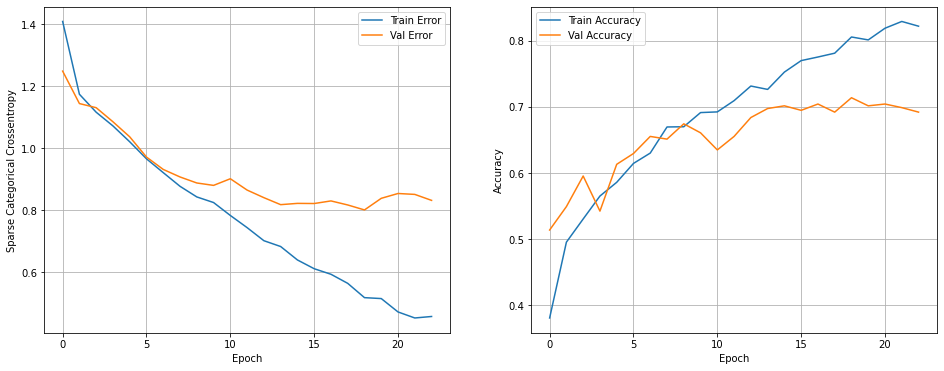

In [ ]:
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=4,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)


epochs = 25
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)

show_loss_accuracy_evolution(history)

In [ ]:
model.evaluate(val_ds)

12/12 [==============================] - 1s 64ms/step - loss: 0.8315 - accuracy: 0.6921


[0.8314850926399231, 0.692098081111908]

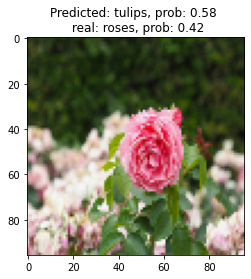

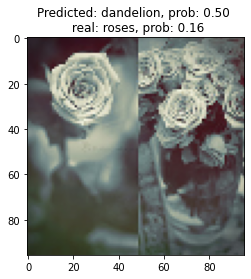

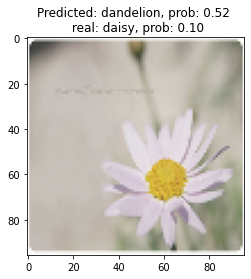

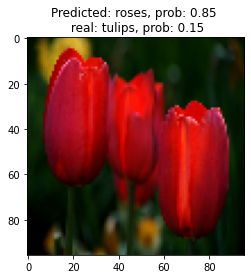

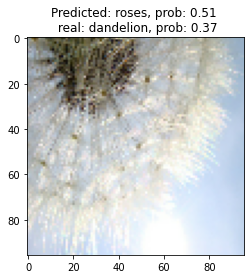

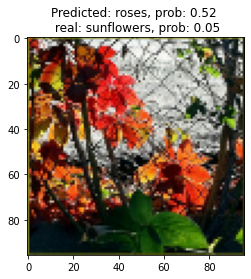

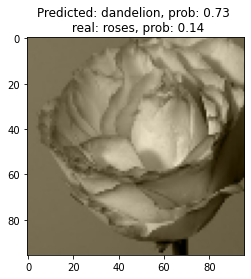

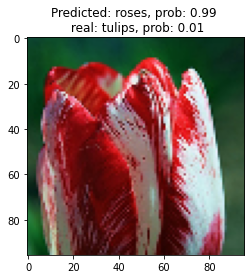

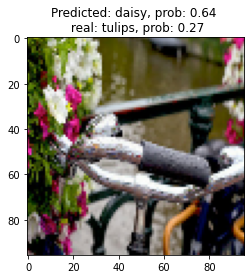

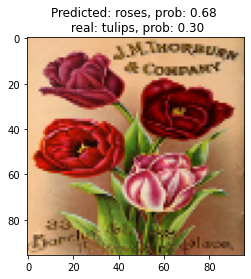

In [ ]:
show_errors(val_ds, model, class_names_list, n_images=10)

### Data Augmentation

[**data augmentation**](https://en.wikipedia.org/wiki/Data_augmentation) We transform randomly the training images.

Data augmentation can be done before starting any training directly on the available image set, or working with the [Keras layers for that purpose](https://www.tensorflow.org/tutorials/images/data_augmentation). In that example we will do it the second way by randomly rotating, flipping and scaling the images.

In [50]:
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip(),
    layers.experimental.preprocessing.RandomRotation(0.25),
    layers.experimental.preprocessing.RandomZoom(0.25),
  ]
)

AttributeError: module 'keras._tf_keras.keras.layers' has no attribute 'experimental'

In [37]:
from tensorflow import keras
from tensorflow.keras import layers

data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),   # 或 "horizontal_and_vertical"
    layers.RandomRotation(0.25),       # 约等于 ±45° 的 1/4
    layers.RandomZoom(0.25),           # 随机缩放
], name="augmentation")


Some examples

数据增强（data augmentation）预览。

循环逻辑是：

先从 train_ds 取 1 个 batch：for images, _ in train_ds.take(1):

每次循环都把同一个 batch丢进 data_augmentation，得到随机变换后的图片；

但你画的是 augmented_images[0] ——也就是这批里的第 1 张，连续画了 9 次，所以看到的是同一张图片被随机翻转/旋转/缩放等后的 9 个版本。

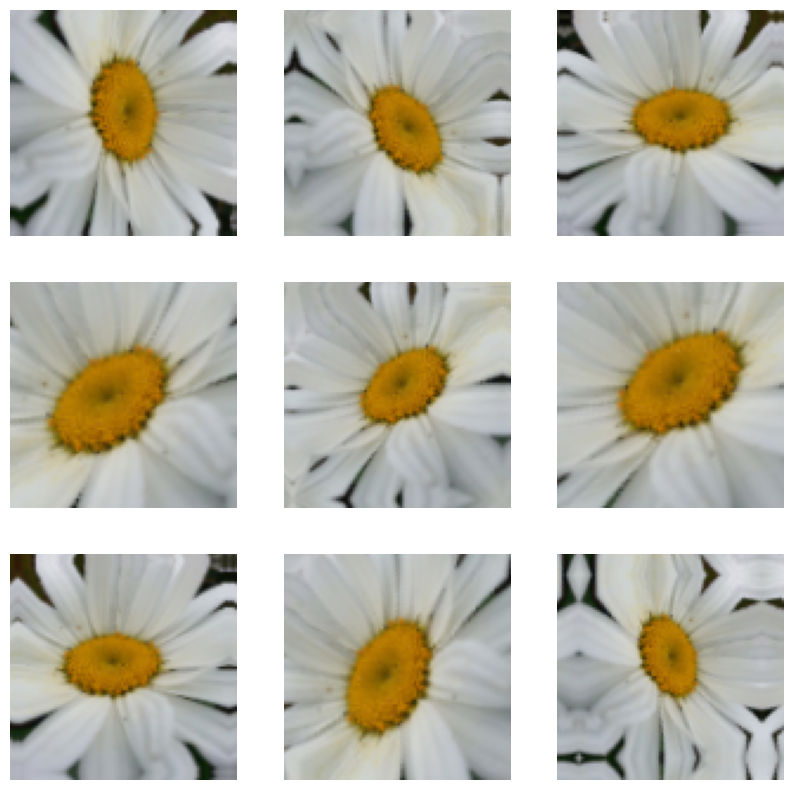

In [38]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

We include the stage that performs the transformations in the images at the beginning of the model that we built previously, we repeat the training and visualize the results.

In [39]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
data_aug = data_augmentation(inputs)
reescaling = layers.Rescaling(1. / 255)(data_aug)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=32, kernel_size=3, padding='same', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(3, 3), name='pool_1')(conv_1)
pool_1 = layers.Dropout(0.4)(pool_1)

# Conv Layer 2
conv_2 = layers.Conv2D(32, 3, padding='same', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)
pool_2 = layers.Dropout(0.4)(pool_2)

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(128, activation='relu', name='dense')(flat)
dense = layers.Dropout(0.4)(dense)



outputs = layers.Dense(5, activation='softmax', name='output')(dense)
model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

输入与预处理

inputs = tf.keras.Input(shape=image_size + (3,))：输入张量，形状例如 (96,96,3)。

data_aug = data_augmentation(inputs)：把你前面定义的数据增强层放进模型里（训练时随机翻转/旋转/缩放，推理时自动关闭）。

rescaling = layers.Rescaling(1./255)(data_aug)：把像素缩放到 0~1，数值更稳定。

卷积块 × 2

Conv1：Conv2D(32, 3, padding='same', activation='relu') 学到 32 个 3×3 特征；same 让高宽不变。

MaxPooling2D(pool_size=(3,3))：降采样（通常用 2×2 更常见，3×3 更激进）。

Dropout(0.4)：随机丢弃部分激活，防过拟合。

Conv2：再来一组 Conv2D(32, 3, padding='same', relu) + MaxPool(2,2) + Dropout(0.4)，提更高级特征并继续降采样。

分类头

Flatten()：把 2D 特征拉平成向量（也可换 GlobalAveragePooling2D() 更轻量稳健）。

Dense(128, relu)：非线性组合特征。

Dropout(0.4)：继续正则化。

Dense(5, softmax)：输出 5 类的概率分布。

形状直觉：(H,W,3) → 卷积保持/略缩尺寸、通道数变多 → 池化让 H,W 变小 → Flatten 变长向量 → Dense → softmax 概率。

以下是回调

EarlyStopping(monitor='val_loss', patience=10, verbose=1)：如果验证集损失 10 个 epoch 没变好就提前停止，防过拟合；可加 restore_best_weights=True 更稳。

编译

optimizer='adam'：自适应学习率优化器，默认就很好用。

loss=SparseCategoricalCrossentropy(from_logits=True)：这里表示期望最后一层给的是 logits（未过 softmax 的原始分数）。

但你的模型最后用了 activation='softmax'，这与 from_logits=True 不匹配。要么把 from_logits=False（或省略），要么去掉最后层的 softmax。否则会影响收敛。

Epoch 1/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 44s 908ms/step - accuracy: 0.2685 - loss: 1.6319 - val_accuracy: 0.4796 - val_loss: 1.2999
Epoch 2/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 32s 696ms/step - accuracy: 0.4233 - loss: 1.2828 - val_accuracy: 0.5477 - val_loss: 1.2139
Epoch 3/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 41s 703ms/step - accuracy: 0.4867 - loss: 1.1989 - val_accuracy: 0.5177 - val_loss: 1.1627
Epoch 4/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 32s 689ms/step - accuracy: 0.5135 - loss: 1.1317 - val_accuracy: 0.5817 - val_loss: 1.0534
Epoch 5/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 31s 679ms/step - accuracy: 0.5533 - loss: 1.1180 - val_accuracy: 0.5913 - val_loss: 1.0283
Epoch 6/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 35s 756ms/step - accuracy: 0.5546 - loss: 1.0988 - val_accuracy: 0.5858 - val_loss: 1.0157
Epoch 7/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 38s 680ms/step - accuracy: 0.5967 - loss: 1.0281 - val_accuracy: 0.6131 - val_loss: 0.9846
Epoch 8/25
46/46 ━━━━━━━━━━━━━━━━━━━━ 41s 681ms/step - accuracy: 0.5921 - loss: 1.0091 - val_accu

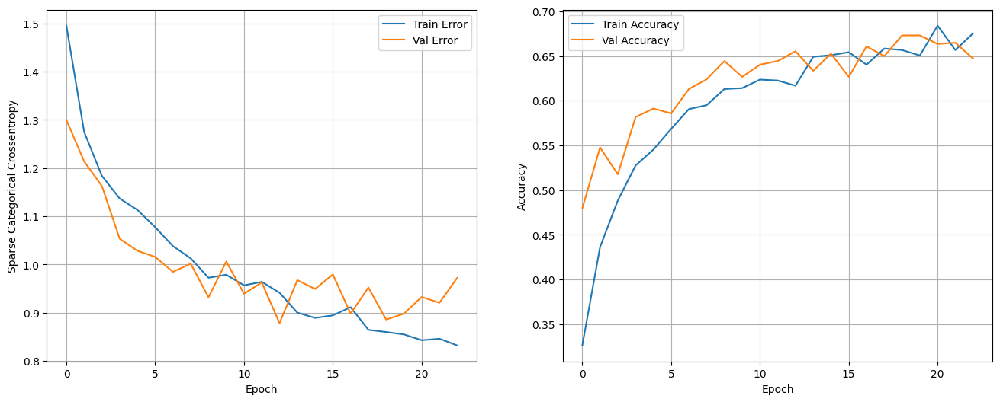

In [40]:
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=10,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

epochs = 25
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)
show_loss_accuracy_evolution(history)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


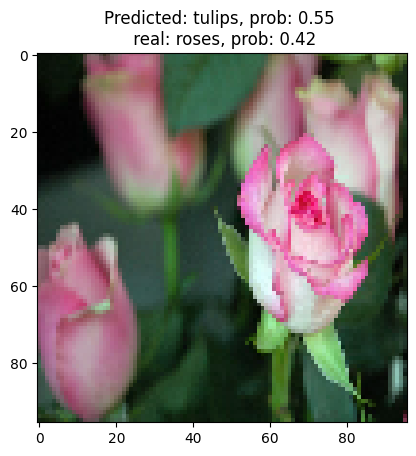

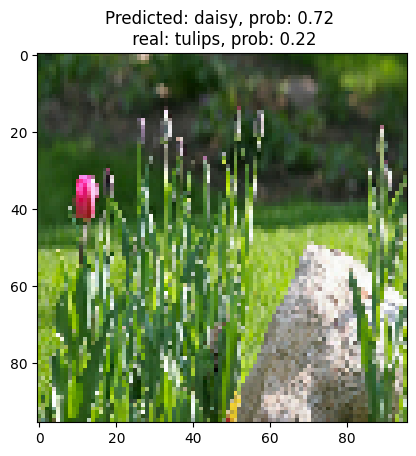

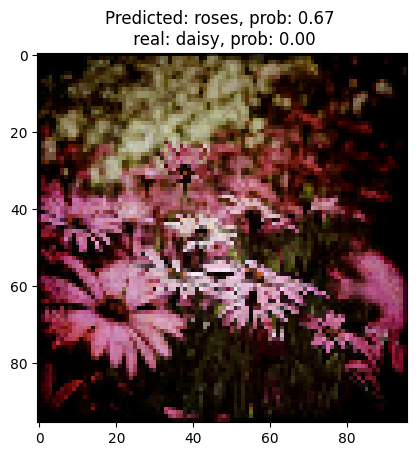

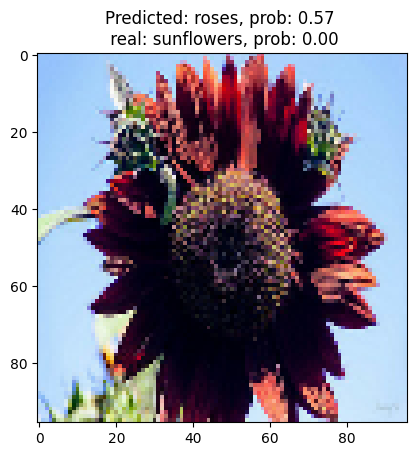

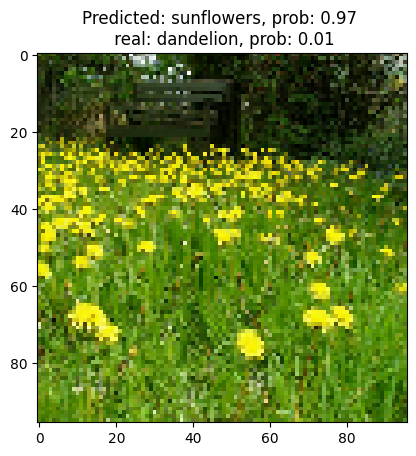

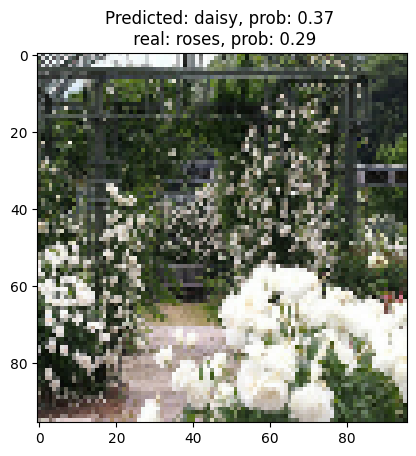

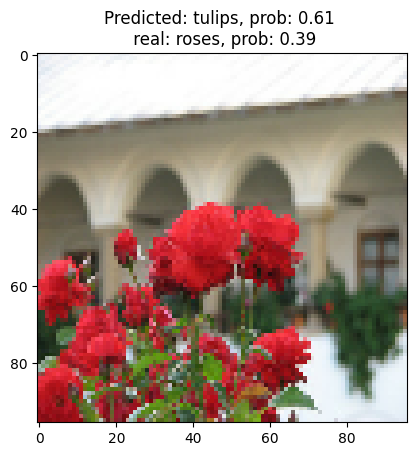

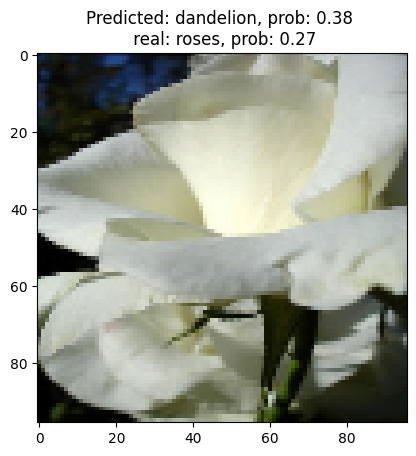

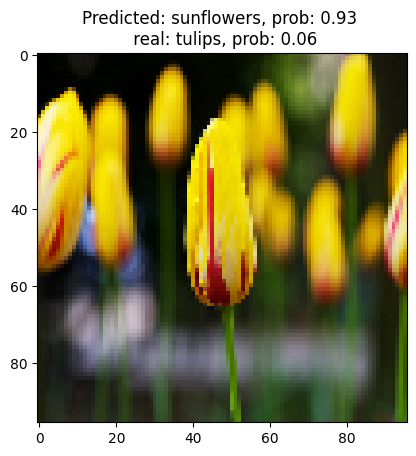

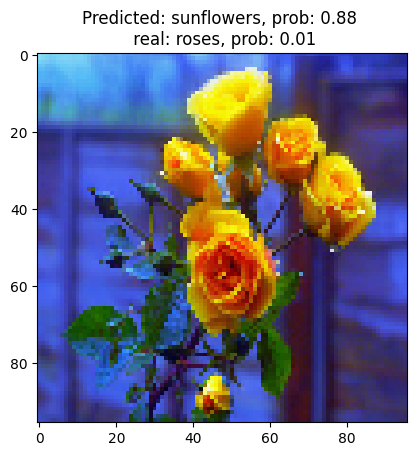

In [42]:
show_errors(val_ds, model, class_names_list, n_images=10)

## Transfer learning

With transfer learning, you benefit from both advanced convolutional neural network architectures developed by top researchers and from pre-training on a huge dataset of images. In our case we will be transfer learning from a network trained on ImageNet, a database of images containing many plants and outdoors scenes, which is close enough to flowers.

<img src="https://i.ibb.co/KsLSGyt/transfer-learning.png" alt="transfer-learning" border="0">

这是在讲 迁移学习（Transfer Learning）：把别人已经在大数据集（如 ImageNet）上训练好的“特征提取器”（大块卷积层）拿来用，你只需要在最后加一个自己的分类头（softmax）来适配你的类别数。

[MobileNetV2](https://arxiv.org/abs/1801.04381) is a significant improvement over MobileNetV1 and pushes the state of the art for mobile visual recognition including classification, object detection and semantic segmentation.

In [`tf.keras.applications`](https://www.tensorflow.org/api_docs/python/tf/keras/applications) you have many pre-trained models. You can compare them [here](https://keras.io/api/applications/#available-models).

With the parameter `include_top=False`, you can delete the last `softmax` layer.

With `pretrained_model.trainable = False`, you freeze the pre-trained model weights.

选预训练模型：MobileNetV2 / ResNet50 / EfficientNet（weights='imagenet'），include_top=False（不要原来的 1000 类头）。

冻结主干（不更新这些权重）：

base.trainable = False


接你自己的头：GlobalAveragePooling2D → Dense(…) → Dense(5, softmax)。

先训练分类头（几轮，学习率正常，如 1e-3）。

可选微调：解冻主干的顶层几层，用更小学习率（如 1e-5）再训练几轮，提升一点点精度。

In [41]:
pretrained_model = tf.keras.applications.MobileNetV2(input_shape=image_size+(3,), include_top=False)
pretrained_model.trainable = False
pretrained_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "mobilenetv2_1.00_96"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 48, 48,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 48, 48,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 48, 48,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 48, 48,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 48, 48,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 48, 48,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 49, 49,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 24, 24,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 24, 24,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

You define your new model adding more layers

In [47]:
model_tl = tf.keras.Sequential([
    layers.Rescaling(1./255),
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5, activation='softmax')
])

In [48]:
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [49]:
epochs = 5
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 32s 596ms/step - accuracy: 0.6211 - loss: 1.4204 - val_accuracy: 0.8433 - val_loss: 0.6866
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 39s 865ms/step - accuracy: 0.8600 - loss: 0.4454 - val_accuracy: 0.8651 - val_loss: 0.5816
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 28s 616ms/step - accuracy: 0.9240 - loss: 0.2136 - val_accuracy: 0.8760 - val_loss: 0.5820
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 26s 577ms/step - accuracy: 0.9435 - loss: 0.1591 - val_accuracy: 0.8597 - val_loss: 0.6359
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 26s 569ms/step - accuracy: 0.9490 - loss: 0.1426 - val_accuracy: 0.8610 - val_loss: 0.6114


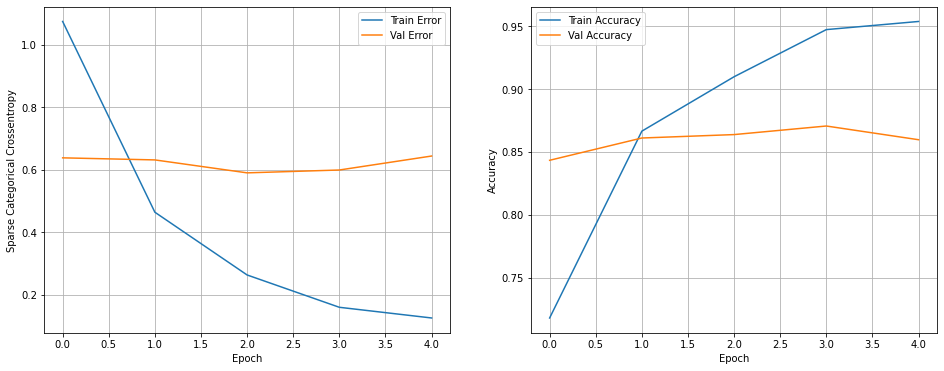

In [ ]:
show_loss_accuracy_evolution(history)

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 478ms/step


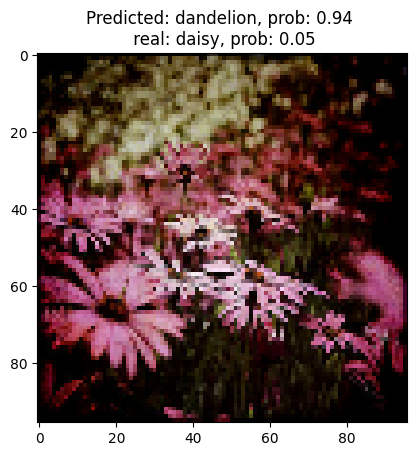

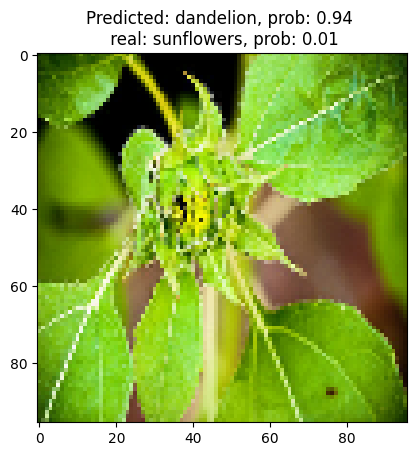

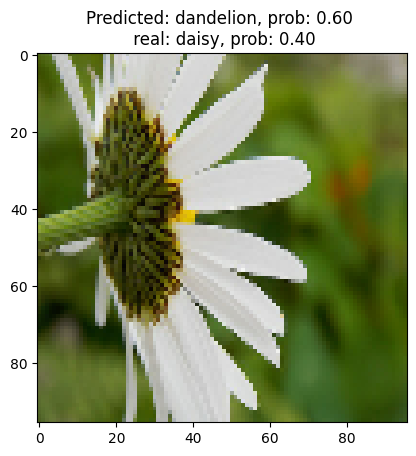

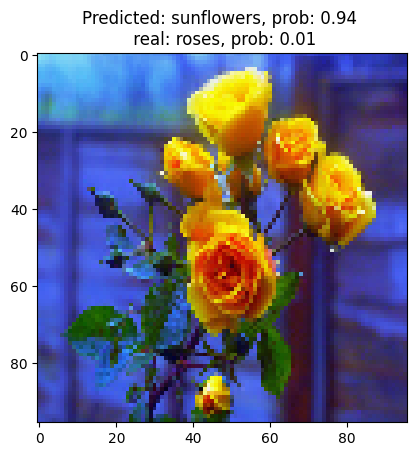

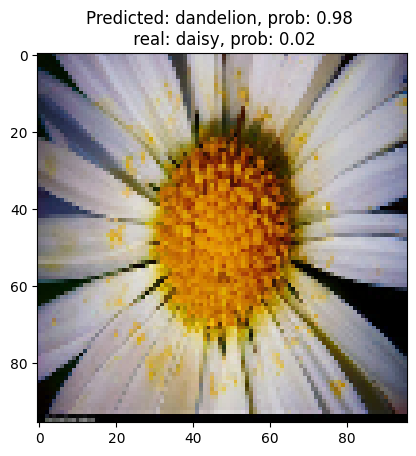

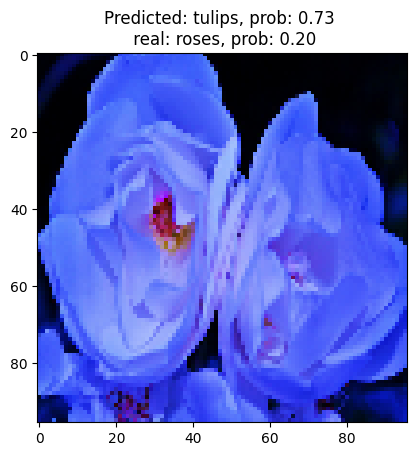

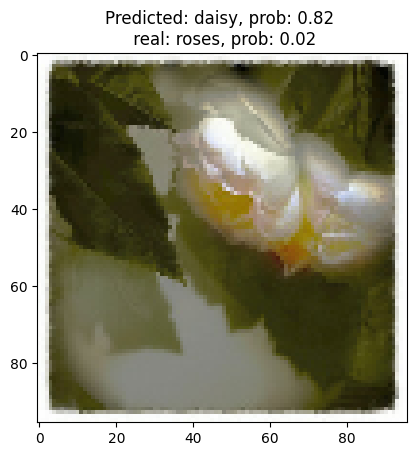

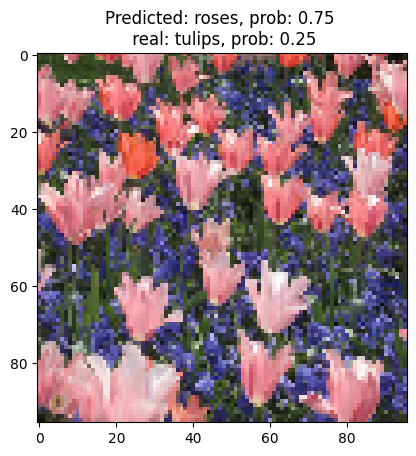

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 467ms/step


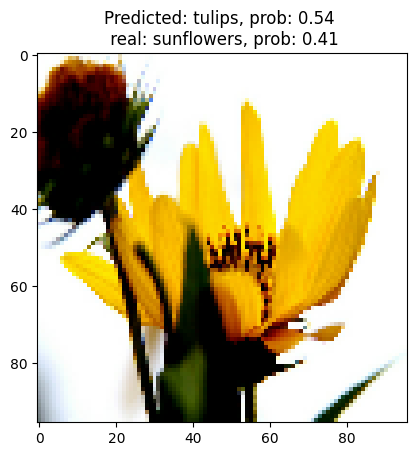

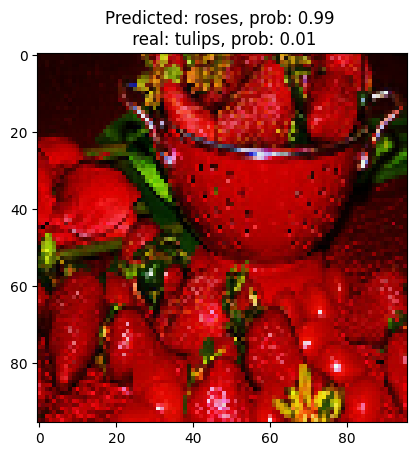

In [50]:
show_errors(val_ds, model_tl, class_names_list, n_images=10)

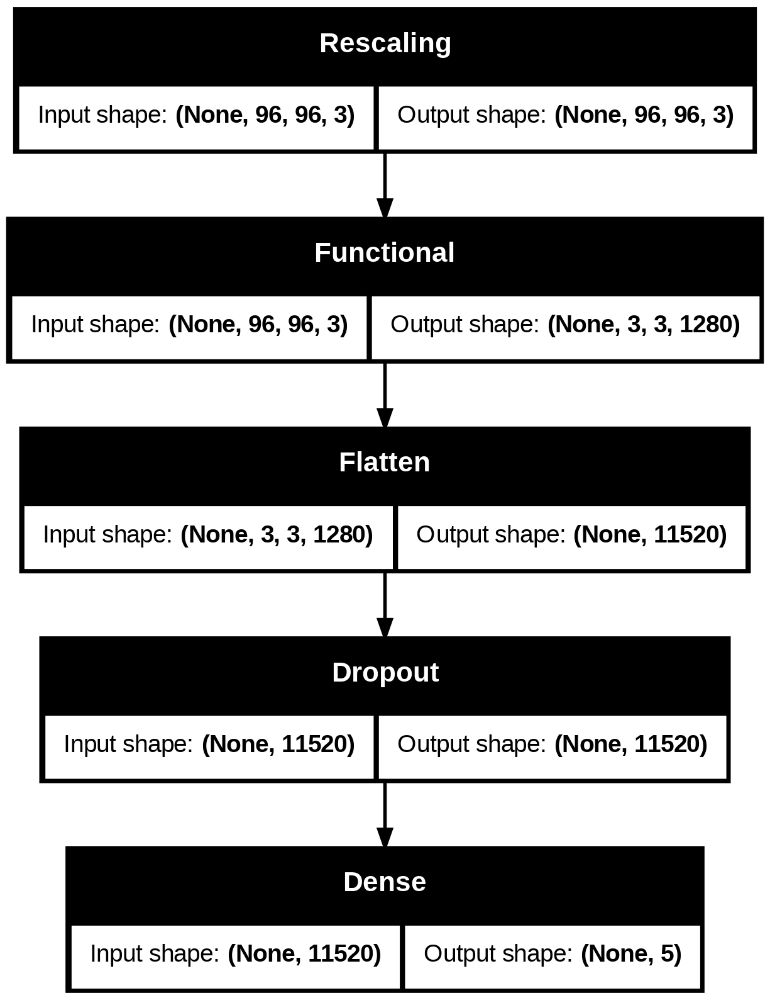

In [51]:
from tensorflow.keras.utils import plot_model
plot_model(model_tl, show_shapes=True)

以下是同一张输入图像走两条分支**——一条是你自己搭的小 CNN，另一条是预训练模型（如 MobileNetV2）——各自产生特征，再**拼接（Concatenate）**到一起，接一个共享的分类头。

In [53]:
inputs = tf.keras.Input(shape=image_size+(3, ), name='input')

#data_aug = data_augmentation(inputs)
reescaling = layers.Rescaling(1./255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(
    2, 2),  name='pool_1')(conv_1)
pool_1 = layers.Dropout(0.4)(pool_1)

# Conv Layer 2
conv_2 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(name='pool_2')(conv_2)
pool_2 = layers.Dropout(0.4)(pool_2)

# Conv Layer 3
conv_3 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_3')(pool_2)
pool_3 = layers.MaxPooling2D(name='pool_3')(conv_3)
pool_3 = layers.Dropout(0.4)(pool_3)

# Fully-connected
x1 = layers.Flatten(name='flatten')(pool_3)

x2 = pretrained_model(reescaling, training=False)
x2 = tf.keras.layers.Flatten()(x2)

x = tf.keras.layers.Concatenate()([x1, x2])
x = layers.Dropout(0.4)(x)
x = layers.Dense(64, activation='relu', name='dense')(x)
# A Dense classifier with a single unit (binary classification
outputs = tf.keras.layers.Dense(5, activation='softmax')(x)
model_tl = keras.Model(inputs, outputs)

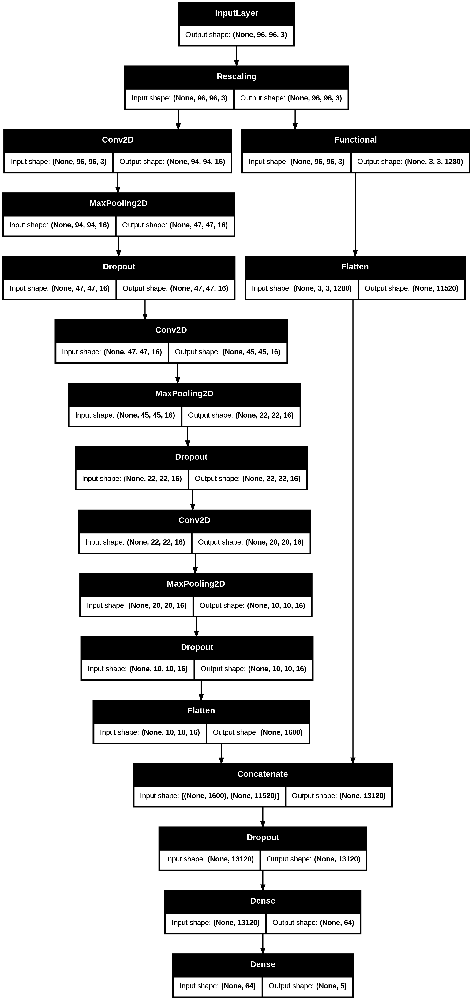

In [54]:
from tensorflow.keras.utils import plot_model
plot_model(model_tl, show_shapes=True)

In [55]:
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)
epochs = 5
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5


/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/nn.py:717: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


46/46 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.6141 - loss: 1.3212 - val_accuracy: 0.8392 - val_loss: 0.4740
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.8974 - loss: 0.2827 - val_accuracy: 0.8597 - val_loss: 0.4772
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 46s 995ms/step - accuracy: 0.9495 - loss: 0.1476 - val_accuracy: 0.8529 - val_loss: 0.5041
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 82s 994ms/step - accuracy: 0.9797 - loss: 0.0679 - val_accuracy: 0.8610 - val_loss: 0.5161
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step - accuracy: 0.9863 - loss: 0.0502 - val_accuracy: 0.8610 - val_loss: 0.5244


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 286ms/step


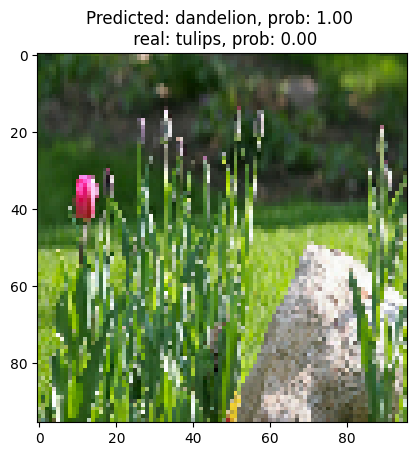

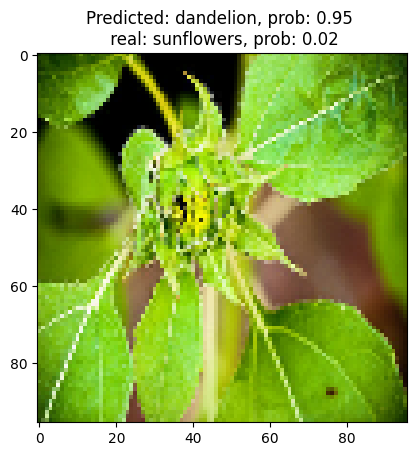

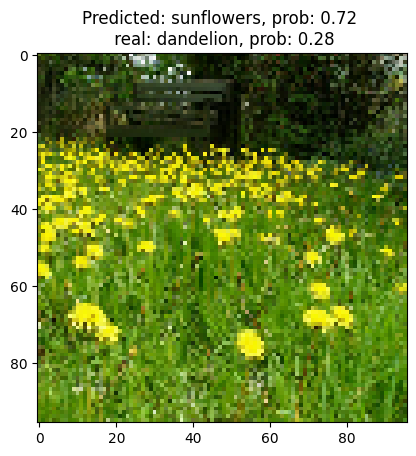

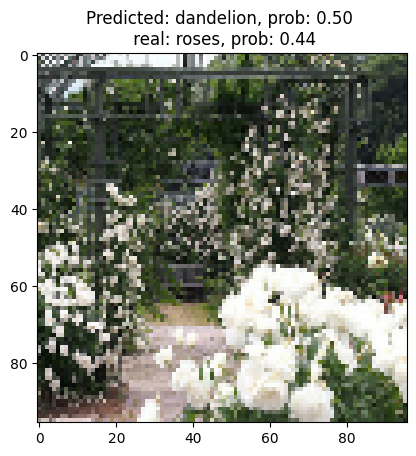

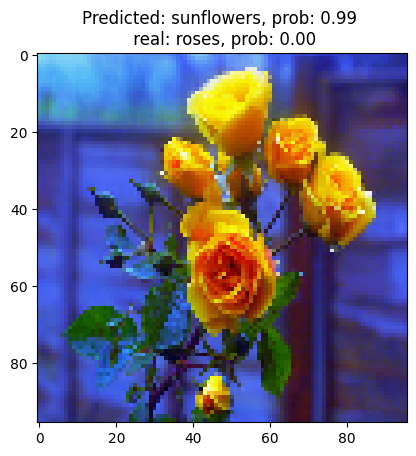

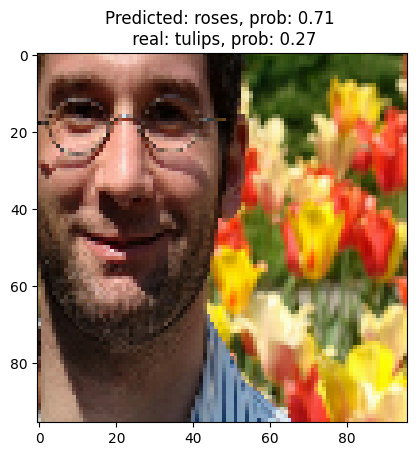

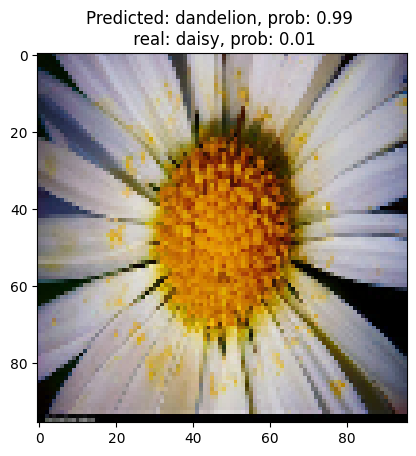

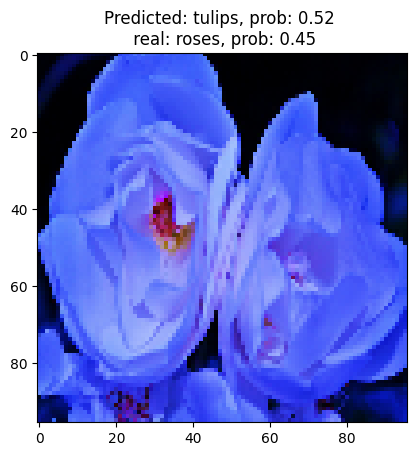

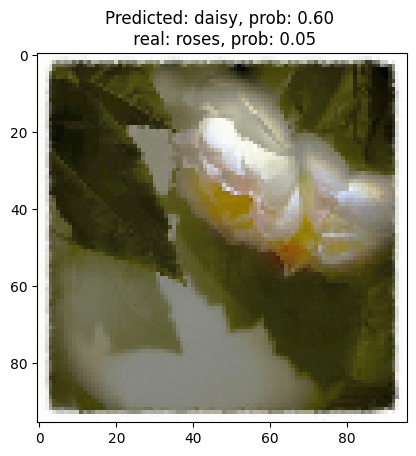

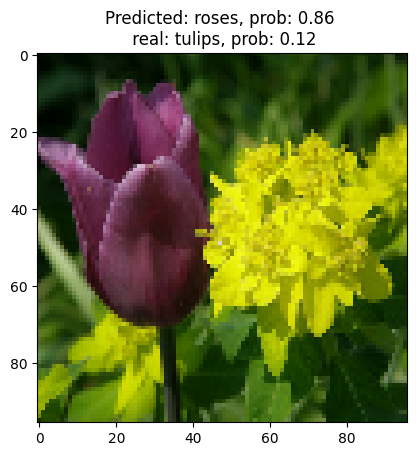

In [56]:
show_errors(val_ds, model_tl, class_names_list, n_images=10)

### Fine-tuning

In [57]:
epochs = 1
model_tl = tf.keras.Sequential([
    data_augmentation,
    layers.Rescaling(1./255),
    tf.keras.applications.MobileNetV2(input_shape=image_size+(3, ), include_top=False),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5, activation='softmax')
])
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

46/46 ━━━━━━━━━━━━━━━━━━━━ 191s 3s/step - accuracy: 0.5797 - loss: 1.6787 - val_accuracy: 0.5381 - val_loss: 5.8247


## Practice: Fashion MNIST Try to obtain  `Test Accuracy>0.89`!!

Fashion MNIST dataset contains 70,000 grayscale images with 10 categories. The images show individual articles of clothing at low resolution (28 by 28 pixels).

<table>
  <tr><td>
    <img src="https://tensorflow.org/images/fashion-mnist-sprite.png"
         alt="Fashion MNIST sprite"  width="300">
  </td></tr>
  <tr><td align="center">
    <b>Figure 1.</b> <a href="https://github.com/zalandoresearch/fashion-mnist">Fashion-MNIST samples</a> (by Zalando, MIT License).<br/>&nbsp;
  </td></tr>
</table>

**Categories**:
<table>
  <tr>
    <th>Label</th>
    <th>Class</th>
  </tr>
  <tr>
    <td>0</td>
    <td>T-shirt/top</td>
  </tr>
  <tr>
    <td>1</td>
    <td>Trouser</td>
  </tr>
    <tr>
    <td>2</td>
    <td>Pullover</td>
  </tr>
    <tr>
    <td>3</td>
    <td>Dress</td>
  </tr>
    <tr>
    <td>4</td>
    <td>Coat</td>
  </tr>
    <tr>
    <td>5</td>
    <td>Sandal</td>
  </tr>
    <tr>
    <td>6</td>
    <td>Shirt</td>
  </tr>
    <tr>
    <td>7</td>
    <td>Sneaker</td>
  </tr>
    <tr>
    <td>8</td>
    <td>Bag</td>
  </tr>
    <tr>
    <td>9</td>
    <td>Ankle boot</td>
  </tr>
</table>

tf.keras.datasets.fashion_mnist.load_data() 会自带把数据分成：

训练集：train_images.shape = (60000, 28, 28)，train_labels.shape = (60000,)

测试集：test_images.shape = (10000, 28, 28)，test_labels.shape = (10000,)

这是官方预先划分的 6 万 / 1 万（10 个类别，灰度 28×28）。

In [3]:
# Load the dataset
fashion_mnist = tf.keras.datasets.fashion_mnist

(train_images, train_labels), (test_images,
                               test_labels) = fashion_mnist.load_data()

print('train_images shape: {0}, test_images shape: {1}'.format(
    train_images.shape, test_images.shape))

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
train_images shape: (60000, 28, 28), test_images shape: (10000, 28, 28)


In [4]:
class_names = [
    'T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt',
    'Sneaker', 'Bag', 'Ankle boot'
]

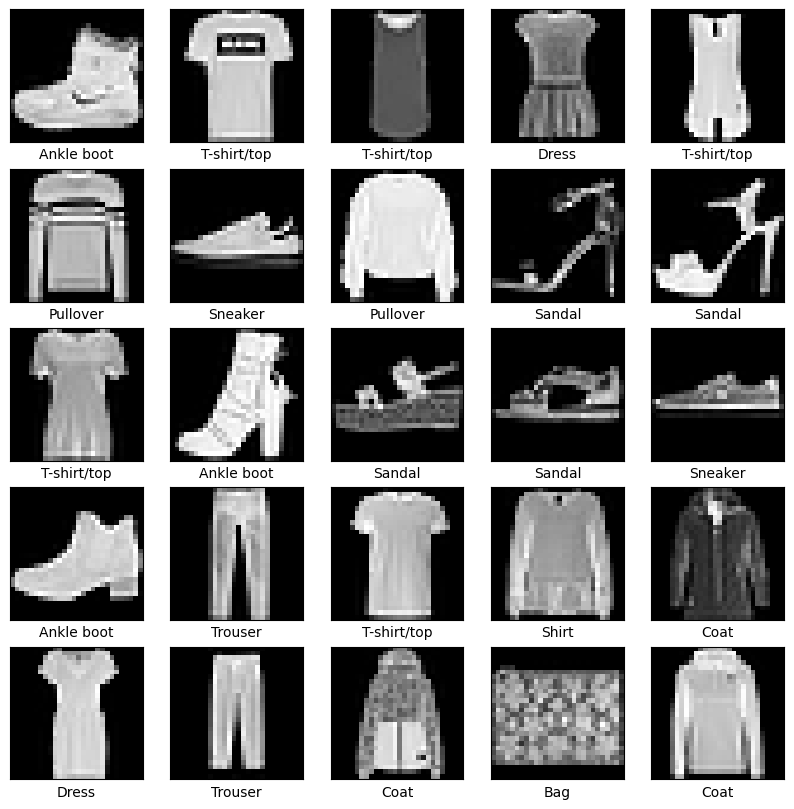

In [5]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap='gray')
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [6]:
from tensorflow import keras
from tensorflow.keras import layers

data_augmentation = keras.Sequential(
  [
    layers.RandomFlip(),
    layers.RandomRotation(0.25),
  ]
)



In [12]:
inputs = tf.keras.Input(shape=(28, 28, 1), name='input') #定义输入占位：高 28、宽 28、通道 1（灰度）。
# aug = data_augmentation(inputs) #这里会做随机旋转/平移/缩放等数据增强（只在训练时生效）。
reescaling = layers.Rescaling(1./255)(inputs)

# Conv Layer 1
conv_1 = layers.BatchNormalization()(reescaling)
conv_1 = layers.Conv2D(16, 3, padding='same')(conv_1) #3×3 卷积，输出16 个特征图；same 让高宽不变。形状：28×28×1 → 28×28×16。
conv_1 = layers.Activation('relu')(conv_1) #ReLU 非线性，形状不变：28×28×16。
pool_1 = layers.MaxPooling2D(pool_size=(2, 2))(conv_1) #2×2 最大池化，高宽减半。形状：28×28×16 → 14×14×16.

# Conv Layer 2
conv_2 = layers.BatchNormalization()(pool_1)
conv_2 = layers.Conv2D(16, 3, padding='same')(conv_2)
conv_2 = layers.Activation('relu')(conv_2)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2))(conv_2)

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2) #展平成向量。形状：7×7×16 → 784（因为 7×7×16=784）。
dense = layers.Dense(128, activation='relu')(flat) #全连接层，128 维特征 + ReLU。形状：784 → 128。
dense = layers.Dropout(0.4)(dense) #Dropout 以 0.4 概率随机屏蔽神经元，防过拟合。形状：128（不变，训练时随机置零）。
outputs = tf.keras.layers.Dense(10, activation='softmax')(dense) #输出 10 类的概率分布（总和为 1）。形状：128 → 10。


model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_mnist') #把以上层级串起来，生成名为 cnn_mnist 的模型。

GlobalAveragePooling2D：可以把 Flatten 换成 GlobalAveragePooling2D()，更轻量、更不易过拟合（输出会是通道数 16，而不是 784）。

In [13]:
### compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [14]:
### train
model.fit(train_images, train_labels,
          epochs=7, batch_size=32, validation_split=0.2)

Epoch 1/7
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7623 - loss: 0.6586 - val_accuracy: 0.8766 - val_loss: 0.3314
Epoch 2/7
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8716 - loss: 0.3553 - val_accuracy: 0.8931 - val_loss: 0.2855
Epoch 3/7
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8890 - loss: 0.2998 - val_accuracy: 0.8925 - val_loss: 0.2814
Epoch 4/7
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8993 - loss: 0.2730 - val_accuracy: 0.8836 - val_loss: 0.3042
Epoch 5/7
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9065 - loss: 0.2502 - val_accuracy: 0.8954 - val_loss: 0.2826
Epoch 6/7
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9145 - loss: 0.2296 - val_accuracy: 0.8995 - val_loss: 0.2544
Epoch 7/7
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9195 - loss: 0.2173 - val_accuracy: 0.9133 - val_loss: 0.2333


In [15]:
results = model.evaluate(test_images, test_labels, verbose=1)
print('Test Loss: {}'.format(results[0]))
print('Test Accuracy: {}'.format(results[1]))

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9029 - loss: 0.2657
Test Loss: 0.26152682304382324
Test Accuracy: 0.904699981212616


### Plotting predictions

In [16]:
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, -1)
predictions.shape, predicted_classes.shape
predictions[i,:]

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


array([3.5822873e-14, 1.0000000e+00, 4.4989869e-16, 2.1664864e-13,
       1.1465319e-15, 1.3269866e-20, 4.7082120e-16, 1.2305265e-17,
       9.9225865e-18, 7.9287661e-19], dtype=float32)

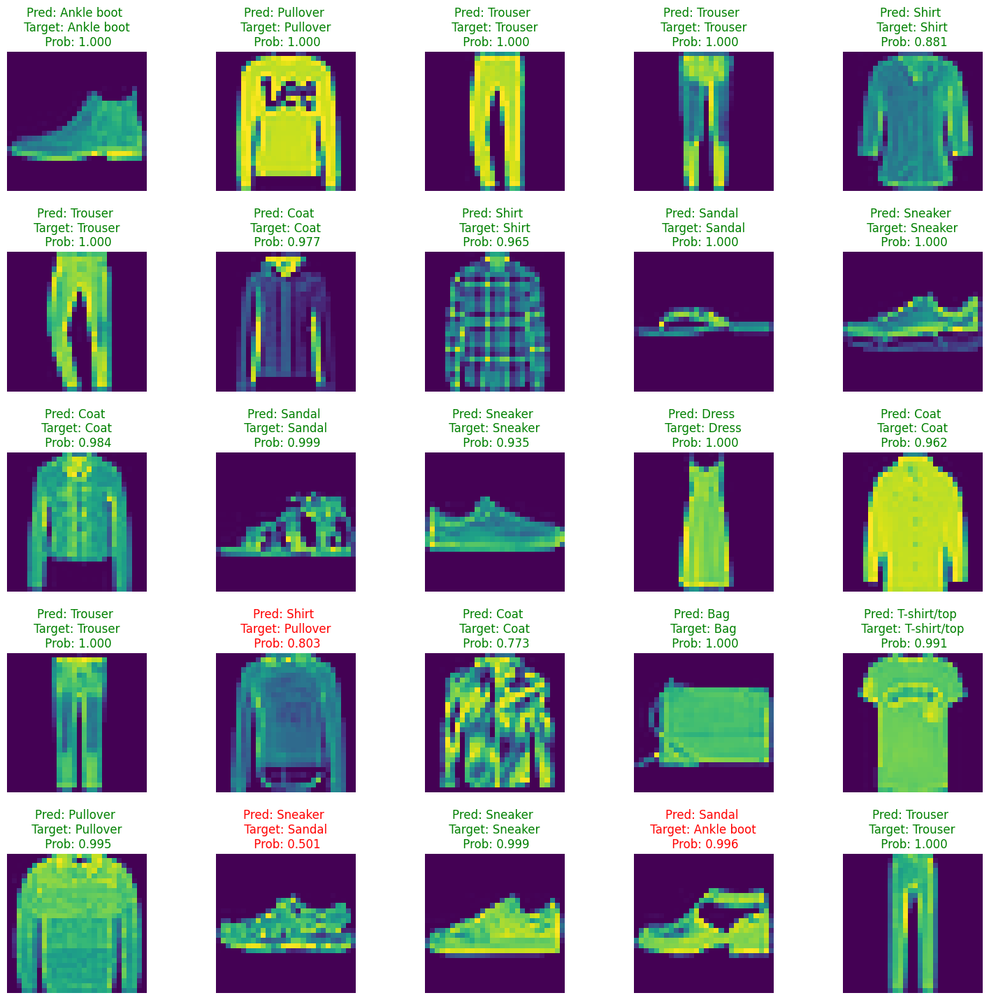

In [17]:
L = 5
W = 5
fig, axes = plt.subplots(L, W, figsize=(18, 18))
axes = axes.ravel()

for i in np.arange(0, L * W):
    axes[i].imshow(test_images[i].reshape(28, 28))
    prob_pred = np.max(predictions[i, :])
    class_pred = class_names[int(predicted_classes[i])]
    original_class = class_names[int(test_labels[i])]
    if class_pred == original_class:
        color = 'green'
    else:
        color = 'red'
    title = "Pred: {0} \n Target: {1} \n Prob: {2:.3f}".format(
    class_pred, original_class, prob_pred)
    axes[i].set_title(title, color=color)
    axes[i].axis('off')

plt.subplots_adjust(wspace=0.5)